Write your own ml code to predict band_gap(target value) based on material magpie features(input data), try random forest
analysis of the most important 10 features

https://nbviewer.org/github/hackingmaterials/matminer_examples/blob/main/matminer_examples/data_retrieval-nb/expt_vs_comp_bandgap.ipynb

https://nbviewer.org/github/hackingmaterials/matminer_examples/blob/main/matminer_examples/machine_learning-nb/bulk_modulus.ipynb

To predict the band gap of materials based on material features using a Random Forest model, you can follow these steps. We will use the Matminer library for feature extraction and a Random Forest regressor for machine learning.

In [ ]:
!pip install matminer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 69.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.3/332.3 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 561.4/561.4 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.8/117.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.7/526.7 kB

In [ ]:
pip install --upgrade matminer


In [ ]:
!pip cache purge


Files removed: 3057


In [ ]:
!pip install pipdeptree

In [ ]:
!pip show numpy

Name: numpy
Version: 1.26.4
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2023, NumPy Developers.
        All rights reserved.
        
        Redistribution and use in source and binary forms, with or without
        modification, are permitted provided that the following conditions are
        met:
        
            * Redistributions of source code must retain the above copyright
               notice, this list of conditions and the following disclaimer.
        
            * Redistributions in binary form must reproduce the above
               copyright notice, this list of conditions and the following
               disclaimer in the documentation and/or other materials provided
               with the distribution.
        
            * Neither the name of the NumPy Developers nor the names of any
               contributors may be used to endorse or promo

In [ ]:
!pip install --upgrade numpy==1.25.2
# !pip install virtualenv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 49.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xgboost 2.1.0 requires nvidia-nccl-cu12; platform_system == "Linux" and platform_machine != "aarch64", which is not installed.
pandas-stubs 2.1.4.231227 requires numpy>=1.26.0; python_version < "3.13", but you have numpy 1.25.2 which is incompatible.


In [ ]:
import numpy
print(numpy.__version__)

1.25.2


In [ ]:
pip install --upgrade scikit-learn

  Using cached scikit_learn-1.5.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB)
Using cached scikit_learn-1.5.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.4 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2


In [ ]:
import numpy as np
import matminer
import sklearn

print("Numpy version:", np.__version__)
print("Matminer version:", matminer.__version__)
print("Scikit-learn version:", sklearn.__version__)


Numpy version: 1.25.2
Matminer version: 0.9.2
Scikit-learn version: 1.5.1


In [ ]:
# Import necessary libraries
import pandas as pd
from matminer.data_retrieval.retrieve_MP import MPDataRetrieval
#from matminer.featurizers import composition as cf
#from matminer.featurizers import structure as sf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Read csv file with the path to your CSV file
df = pd.read_csv('/content/bandgap-magpie.csv')


In [ ]:
df.head()


,material_id,pretty_formula,band_gap,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,MagpieData mode Number,MagpieData minimum MendeleevNumber,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
0,mp-1003771,MgMn6O12,0.3416,8,25,17,13.578947,7.213296,8,52,...,0.00031,0.000098,0.000134,0.0,12,217,205,86.315789,93.872576,12
1,mp-1013878,LiV3P3O13,1.2858,3,23,20,11.050000,4.770000,8,1,...,0.00000,0.000000,0.000000,0.0,2,229,227,53.900000,70.040000,12
2,mp-1020623,ZnSiO3,3.5783,8,30,22,13.600000,6.720000,8,69,...,0.00000,0.000000,0.000000,0.0,12,227,215,91.400000,95.280000,12
3,mp-1025629,Te6Mo2W,1.2732,42,74,32,52.222222,4.839506,52,50,...,0.00000,0.000000,0.000000,0.0,152,229,77,177.666667,34.222222,152
4,mp-1026909,Mo3W(SeS)4,1.3755,16,74,58,33.333333,11.555556,16,50,...,0.00000,0.000000,0.000000,0.0,14,229,215,104.333333,83.111111,14


In [ ]:
X_train=df.iloc[:,3:]
y_train=df.iloc[:,2]

In [ ]:
X_train

,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,MagpieData mode Number,MagpieData minimum MendeleevNumber,MagpieData maximum MendeleevNumber,MagpieData range MendeleevNumber,MagpieData mean MendeleevNumber,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
0,8,25,17,13.578947,7.213296,8,52,87,35,74.947368,...,0.00031,0.000098,0.000134,0.0,12,217,205,86.315789,93.872576,12
1,3,23,20,11.050000,4.770000,8,1,87,86,75.950000,...,0.00000,0.000000,0.000000,0.0,2,229,227,53.900000,70.040000,12
2,8,30,22,13.600000,6.720000,8,69,87,18,81.600000,...,0.00000,0.000000,0.000000,0.0,12,227,215,91.400000,95.280000,12
3,42,74,32,52.222222,4.839506,52,50,90,40,76.777778,...,0.00000,0.000000,0.000000,0.0,152,229,77,177.666667,34.222222,152
4,16,74,58,33.333333,11.555556,16,50,89,39,75.750000,...,0.00000,0.000000,0.000000,0.0,14,229,215,104.333333,83.111111,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67805,8,30,22,15.428571,8.489796,8,46,87,41,72.714286,...,0.00000,0.000000,0.000000,0.0,12,229,217,100.000000,100.571429,12
67806,8,42,34,20.857143,14.693878,8,50,87,37,73.857143,...,0.00000,0.000000,0.000000,0.0,12,229,217,100.000000,100.571429,12
67807,8,23,15,12.857143,5.795918,8,46,87,41,72.571429,...,0.00000,0.000000,0.000000,0.0,12,229,217,100.000000,100.571429,12
67808,8,74,66,22.300000,17.620000,8,7,87,80,64.200000,...,0.00000,0.000000,0.000000,0.0,12,229,217,94.900000,99.480000,12


In [ ]:
y_train

,band_gap
0,0.3416
1,1.2858
2,3.5783
3,1.2732
4,1.3755
5,0.2689
6,1.2888
7,1.5276
8,1.4277
9,0.6334


In [ ]:
missing_values = X_train.isnull().sum()
print(missing_values)


MagpieData minimum Number              0
MagpieData maximum Number              0
MagpieData range Number                0
MagpieData mean Number                 0
MagpieData avg_dev Number              0
                                      ..
MagpieData maximum SpaceGroupNumber    0
MagpieData range SpaceGroupNumber      0
MagpieData mean SpaceGroupNumber       0
MagpieData avg_dev SpaceGroupNumber    0
MagpieData mode SpaceGroupNumber       0
Length: 132, dtype: int64


In [ ]:
X_train = X_train.dropna()
y_train = y_train[X_train.index]

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split


# Assuming you have X and y defined as your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Instantiate the imputer
imputer = SimpleImputer(strategy='mean')

# Fit and transform on X_train
X_train = imputer.fit_transform(X_train)

# Transform X_test using the fitted imputer
X_test = imputer.transform(X_test)


In [ ]:
# Initialize the Random Forest regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_regressor.fit(X_train, y_train)

# Make predictions
y_pred = rf_regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [ ]:
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

Mean Squared Error: 0.586579866281412
R-squared Score: 0.7620041054099441


In [ ]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import pandas as pd

# Convert X_train from NumPy array to DataFrame
X_train_df = pd.DataFrame(X_train)

# Now you can access the columns attribute
columns = X_train_df.columns

# Assuming you have already trained your RandomForestRegressor model rf_regressor

# Get feature importances from the trained model
feature_importances = rf_regressor.feature_importances_

# Get the indices of the top 5 features
top_5_indices = np.argsort(feature_importances)[::-1][:5]

# Get the names of the top 5 features
top_5_features = columns[top_5_indices]

# Get the corresponding importances of the top 5 features
top_5_importances = feature_importances[top_5_indices]

# Save the top features and their importances to a file
top_features_df = pd.DataFrame({'Feature': top_5_features, 'Importance': top_5_importances})
top_features_df.to_csv('top_5_features.csv', index=False)

# Or store them in a variable for later use
top_features = dict(zip(top_5_features, top_5_importances))


In [ ]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import pandas as pd

# Convert X_train from NumPy array to DataFrame
X_train_df = pd.DataFrame(X_train)

# Now you can access the columns attribute
columns = X_train_df.columns

# Assuming you have already trained your RandomForestRegressor model rf_regressor

# Get feature importances from the trained model
feature_importances = rf_regressor.feature_importances_

# Get the indices of the top 10 features
top_10_indices = np.argsort(feature_importances)[::-1][:10]

# Get the names of the top 10 features
top_10_features = columns[top_10_indices]

# Get the corresponding importances of the top 10 features
top_10_importances = feature_importances[top_10_indices]

# Save the top features and their importances to a file
top_features_df = pd.DataFrame({'Feature': top_10_features, 'Importance': top_10_importances})
top_features_df.to_csv('top_10_features.csv', index=False)


# Or store them in a variable for later use
top_features = dict(zip(top_10_features, top_10_importances))


In [ ]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import pandas as pd

# Convert X_train from NumPy array to DataFrame
X_train_df = pd.DataFrame(X_train)

# Now you can access the columns attribute
columns = X_train_df.columns

# Assuming you have already trained your RandomForestRegressor model rf_regressor

# Get feature importances from the trained model
feature_importances = rf_regressor.feature_importances_

# Get the indices of the top 20 features
top_20_indices = np.argsort(feature_importances)[::-1][:20]

# Get the names of the top 20 features
top_20_features = columns[top_20_indices]

# Get the corresponding importances of the top 20 features
top_20_importances = feature_importances[top_20_indices]

# Save the top features and their importances to a file
top_features_df = pd.DataFrame({'Feature': top_20_features, 'Importance': top_20_importances})
top_features_df.to_csv('top_20_features.csv', index=False)


# Or store them in a variable for later use
top_features = dict(zip(top_20_features, top_20_importances))

Deep learning models to predict band_gap(target value) based on material magpie features.

It is for a **regression problem**. Regression problems aim to predict a continuous value, not a class. Therefore, the evaluation metric for regression problems is usually the Mean Squared Error (MSE) and not accuracy.

with**Adam optimizer** and **learning_rate=0.001** and **epochs=50**






In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)  # Adjust the learning rate
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 11195.3613 - val_loss: 479.0123
Epoch 2/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1248.1178 - val_loss: 70.2669
Epoch 3/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 685.3948 - val_loss: 38.3489
Epoch 4/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 375.3605 - val_loss: 95.6722
Epoch 5/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270.7946 - val_loss: 23.5244
Epoch 6/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 159.3181 - val_loss: 29.8621
Epoch 7/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 148.0764 - val_loss: 18.6108
Epoch 8/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 105.4346 - val_loss: 8.5430
Epoch 9/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 104.0350 - val_loss: 14.0330
Epoch 10/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 73.3952 - val_loss: 9.5685
Epoch 11/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 41.9405 - val_loss: 10.7249
Epoch 12/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, clipvalue=1.0),
]

# List of activations
activations = [
    'relu',  # ReLU activation
     tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]
# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9)  # Adjust the learning rate and use beta_1
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


78/78 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 7810.3911 - val_loss: 21.9766
Epoch 2/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283.4544 - val_loss: 8.8295
Epoch 3/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 106.5395 - val_loss: 5.2448
Epoch 4/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.1380 - val_loss: 4.5264
Epoch 5/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18.0078 - val_loss: 4.0975
Epoch 6/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.2536 - val_loss: 3.7184
Epoch 7/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10.6040 - val_loss: 3.7620
Epoch 8/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.5699 - val_loss: 3.5826
Epoch 9/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7848 - val_loss: 3.5275
Epoch 10/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.1485 - val_loss: 3.3086
Epoch 11/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.8127 - val_loss: 3.5272
Epoch 12/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0055 - val_

**Showing Plots**

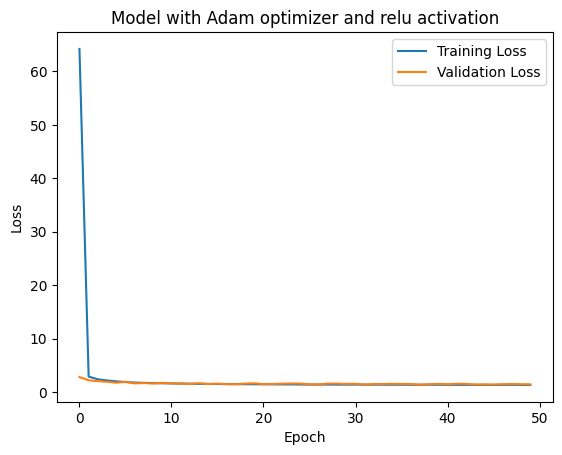

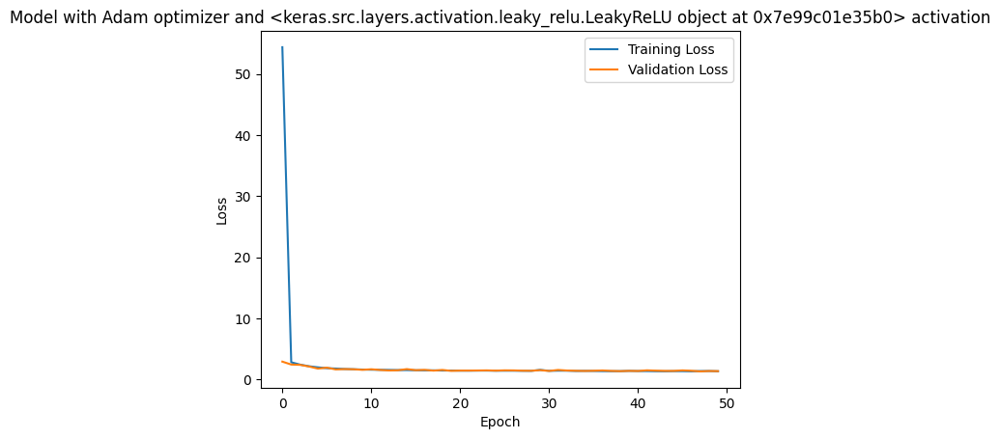

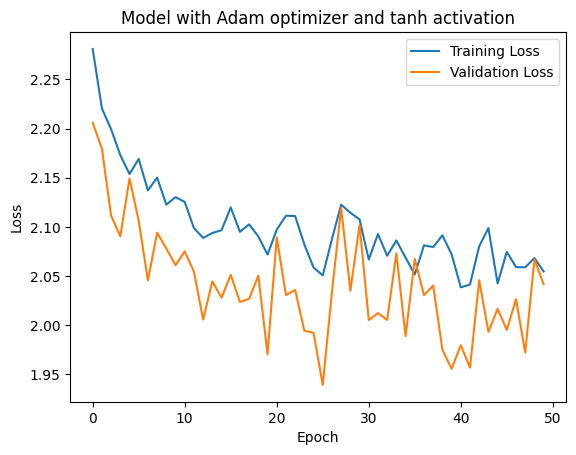

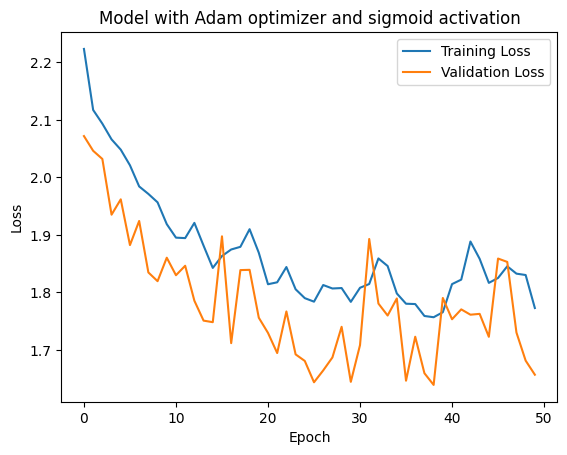

In [ ]:
import matplotlib.pyplot as plt

# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Compile the model
        optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001, beta_1=0.9)  # Adjust the learning rate and use beta_1
        model.compile(optimizer=optimizer, loss='mean_squared_error')
        # Train the model
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


with**Adam optimizer** and **learning_rate=0.001** and **epochs=100**


In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, clipvalue=1.0),
]

# List of activations
activations = [
    'relu',  # ReLU activation
     tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]
# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1695/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 223.4250 - val_loss: 2.6306
Epoch 2/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 2.5429 - val_loss: 2.2117
Epoch 3/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 2.2341 - val_loss: 2.1363
Epoch 4/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 2.0894 - val_loss: 1.7720
Epoch 5/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 2.0484 - val_loss: 1.9877
Epoch 6/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 2.0007 - val_loss: 2.1943
Epoch 7/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.9345 - val_loss: 1.7464
Epoch 8/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.8464 - val_loss: 1.6856
Epoch 9/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 1.8252 - val_loss: 1.7878
Epoch 10/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1.7782 - val_loss: 1.6191
Epoch 11/100
1695/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.7057 - val_loss: 1.5450
Epoch 12/100
1695/1695 ━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


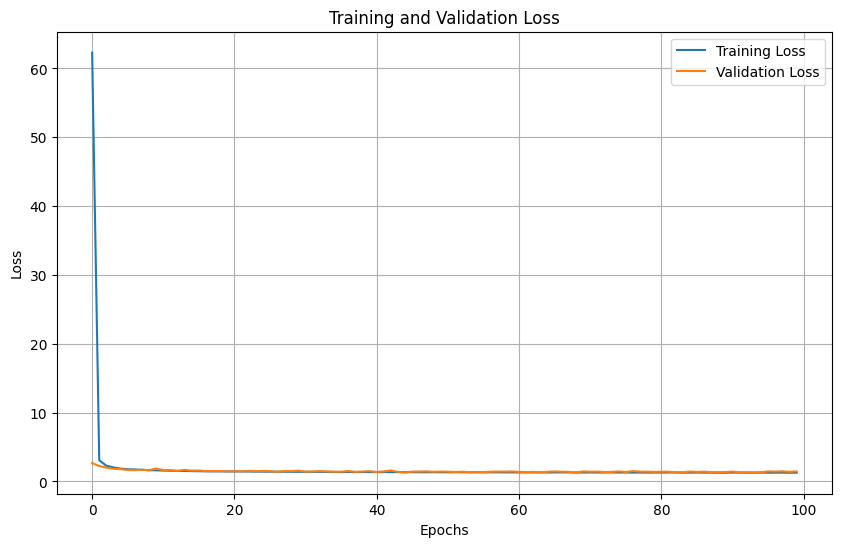

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 1.4443
Mean Squared Error on Test Set: 1.4510658979415894


In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# We have X_train, X_test, y_train, and y_test defined

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=0)

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')

with **Adam optimizer** and **learning_rate=0.001** and **epochs=150**


In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, clipvalue=1.0),
]

# List of activations
activations = [
    'relu',  # ReLU activation
     tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]
# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9)  # Adjust the learning rate and use beta_1
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
39/39 [==============================] - 5s 8ms/step - loss: 7575.9976 - val_loss: 131.7796
Epoch 2/150
39/39 [==============================] - 0s 5ms/step - loss: 798.7336 - val_loss: 53.0424
Epoch 3/150
39/39 [==============================] - 0s 4ms/step - loss: 417.9604 - val_loss: 10.7800
Epoch 4/150
39/39 [==============================] - 0s 4ms/step - loss: 318.4738 - val_loss: 5.8350
Epoch 5/150
39/39 [==============================] - 0s 7ms/step - loss: 207.9426 - val_loss: 9.8400
Epoch 6/150
39/39 [==============================] - 0s 8ms/step - loss: 144.1715 - val_loss: 10.8725
Epoch 7/150
39/39 [==============================] - 0s 7ms/step - loss: 114.8858 - val_loss: 15.5537
Epoch 8/150
39/39 [==============================] - 0s 7ms/step - loss: 74.1896 - val_loss: 12.9782
Epoch 9/150
39/39 [==============================] - 0s 6ms/step - loss: 59.6329 - val_loss: 10.0924
Epoch 10/150
39/39 [==============================] - 0s 6ms/step - loss: 45.0798 - 

with **Adam optimizer** and **learning_rate=0.001** and **epochs=200**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, clipvalue=1.0),
]

# List of activations
activations = [
    'relu',  # ReLU activation
     tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]
# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9)  # Adjust the learning rate and use beta_1
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


because **it is not a classification task** we dont need the Accuracy here.
this code does not include accuracy, but rather it **includes MSE loss evaluation**.

**Model with top 5/10/20 features.csv**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_5_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=100, batch_size=32, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
342/342 [==============================] - 8s 6ms/step - loss: 2.0711 - val_loss: 1.7427
Epoch 2/100
342/342 [==============================] - 2s 4ms/step - loss: 1.7962 - val_loss: 1.7047
Epoch 3/100
342/342 [==============================] - 1s 4ms/step - loss: 1.7487 - val_loss: 1.6308
Epoch 4/100
342/342 [==============================] - 2s 5ms/step - loss: 1.7267 - val_loss: 1.6297
Epoch 5/100
342/342 [==============================] - 1s 4ms/step - loss: 1.6944 - val_loss: 1.6947
Epoch 6/100
342/342 [==============================] - 2s 5ms/step - loss: 1.6828 - val_loss: 1.6457
Epoch 7/100
342/342 [==============================] - 2s 5ms/step - loss: 1.6556 - val_loss: 1.5851
Epoch 8/100
342/342 [==============================] - 2s 6ms/step - loss: 1.6417 - val_loss: 1.6005
Epoch 9/100
342/342 [==============================] - 1s 4ms/step - loss: 1.6365 - val_loss: 1.6920
Epoch 10/100
342/342 [==============================] - 1s 4ms/step - loss: 1.6273 - val_lo

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_10_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_10 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_10, X_test_scaled_10, y_train, y_test = train_test_split(X_scaled_10, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_10, y_train, epochs=100, batch_size=32, validation_data=(X_test_scaled_10, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_10, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
1356/1356 [==============================] - 5s 3ms/step - loss: 1.7567 - val_loss: 1.5607
Epoch 2/100
1356/1356 [==============================] - 5s 4ms/step - loss: 1.4948 - val_loss: 1.4407
Epoch 3/100
1356/1356 [==============================] - 3s 2ms/step - loss: 1.4338 - val_loss: 1.3672
Epoch 4/100
1356/1356 [==============================] - 4s 3ms/step - loss: 1.4024 - val_loss: 1.3468
Epoch 5/100
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3679 - val_loss: 1.3479
Epoch 6/100
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3467 - val_loss: 1.2848
Epoch 7/100
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3174 - val_loss: 1.2622
Epoch 8/100
1356/1356 [==============================] - 3s 3ms/step - loss: 1.3015 - val_loss: 1.3284
Epoch 9/100
1356/1356 [==============================] - 5s 3ms/step - loss: 1.2910 - val_loss: 1.2202
Epoch 10/100
1356/1356 [==============================] - 3s 2ms/step - l

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_20 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_20, X_test_scaled_20, y_train, y_test = train_test_split(X_scaled_20, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_20, y_train, epochs=100, batch_size=32, validation_data=(X_test_scaled_20, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_20, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1356/1356 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 1.9580 - val_loss: 1.3493
Epoch 2/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.4261 - val_loss: 1.2732
Epoch 3/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.3423 - val_loss: 1.3057
Epoch 4/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 1.3041 - val_loss: 1.2389
Epoch 5/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 1.2600 - val_loss: 1.2254
Epoch 6/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.2100 - val_loss: 1.1702
Epoch 7/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.1788 - val_loss: 1.1515
Epoch 8/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.1810 - val_loss: 1.1441
Epoch 9/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 1.1296 - val_loss: 1.1232
Epoch 10/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 1.1343 - val_loss: 1.0850
Epoch 11/100
1356/1356 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 1.0839 - val_loss: 1.0694
Epoch 12/100
1356/1356 ━━━━━━━━

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features
top_features = top_features_df['Feature'].tolist()

# Assuming X_train_df and y_train are already defined somewhere in your code
# X_train_df should have the same number of samples as y_train
#X_train_df = pd.read_csv('X_train.csv')  # Load your complete training data
#y_train = pd.read_csv('y_train.csv')  # Load your complete target data

# Select only the top features from X_train_df and split the data
X_train_top = X_train_df[top_features]

# Split the data into training and testing sets
X_train_top, X_test_top, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_top)
X_test_scaled = scaler.transform(X_test_top)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_data=(X_test_scaled, y_test), verbose=0)

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


ValueError: Found input variables with inconsistent numbers of samples: [54239, 43391]

With **SGD optimizer** and **learning_rate= 0.001** and **Epochs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
234/234 [==============================] - 1s 3ms/step - loss: 2241.5627 - val_loss: 68.0951
Epoch 2/50
234/234 [==============================] - 1s 3ms/step - loss: 185.1030 - val_loss: 12.2548
Epoch 3/50
234/234 [==============================] - 1s 3ms/step - loss: 35.2977 - val_loss: 4.5948
Epoch 4/50
234/234 [==============================] - 1s 4ms/step - loss: 6.3569 - val_loss: 4.3983
Epoch 5/50
234/234 [==============================] - 1s 3ms/step - loss: 3.1799 - val_loss: 3.0511
Epoch 6/50
234/234 [==============================] - 1s 3ms/step - loss: 2.9907 - val_loss: 3.3782
Epoch 7/50
234/234 [==============================] - 1s 2ms/step - loss: 2.6995 - val_loss: 2.5781
Epoch 8/50
234/234 [==============================] - 1s 2ms/step - loss: 2.5728 - val_loss: 2.2239
Epoch 9/50
234/234 [==============================] - 1s 2ms/step - loss: 2.5180 - val_loss: 2.7486
Epoch 10/50
234/234 [==============================] - 1s 3ms/step - loss: 2.5063 - val_loss

with **More layers** of  **SGD optimizer** and **ephocs=50** and **Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
234/234 [==============================] - 3s 7ms/step - loss: 159.0414 - val_loss: 3.2119
Epoch 2/50
234/234 [==============================] - 1s 6ms/step - loss: 3.3697 - val_loss: 3.0598
Epoch 3/50
234/234 [==============================] - 1s 6ms/step - loss: 2.8828 - val_loss: 2.9895
Epoch 4/50
234/234 [==============================] - 1s 4ms/step - loss: 2.7013 - val_loss: 1.9973
Epoch 5/50
234/234 [==============================] - 1s 4ms/step - loss: 2.5863 - val_loss: 2.5252
Epoch 6/50
234/234 [==============================] - 1s 4ms/step - loss: 2.4884 - val_loss: 2.3141
Epoch 7/50
234/234 [==============================] - 1s 6ms/step - loss: 2.4384 - val_loss: 1.9830
Epoch 8/50
234/234 [==============================] - 1s 5ms/step - loss: 2.3615 - val_loss: 2.0944
Epoch 9/50
234/234 [==============================] - 1s 4ms/step - loss: 2.3250 - val_loss: 2.5870
Epoch 10/50
234/234 [==============================] - 1s 3ms/step - loss: 2.3144 - val_loss: 2.09

showing **some plots** for these models.

---

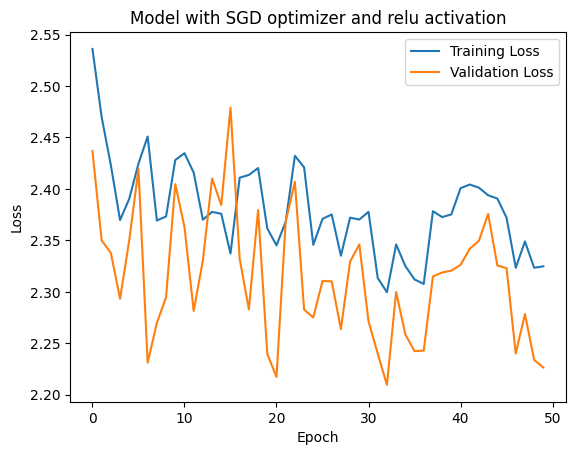

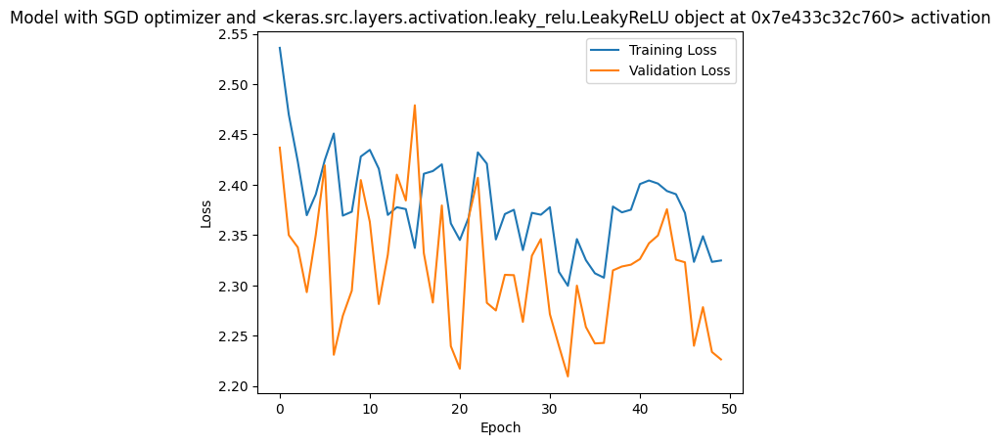

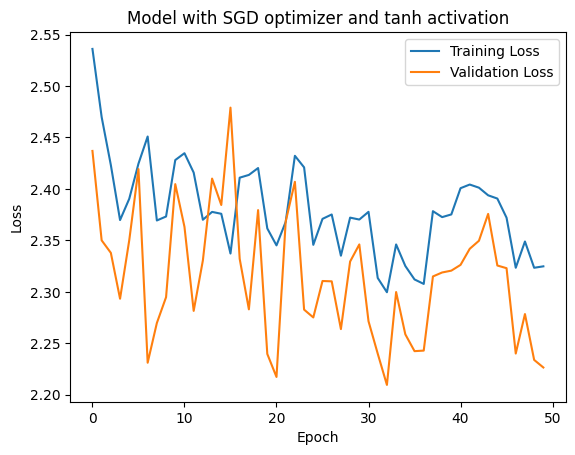

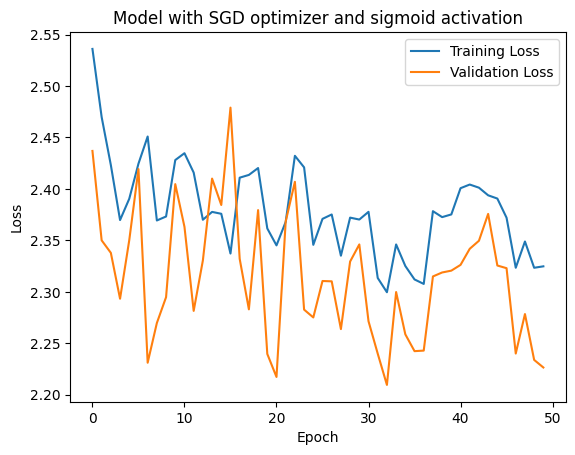

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


with just **SGD optimizer** and **ephocs=100** and **learning_rate=0.001**



In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
234/234 [==============================] - 2s 4ms/step - loss: 282.9249 - val_loss: 2.6653
Epoch 2/100
234/234 [==============================] - 1s 4ms/step - loss: 3.5403 - val_loss: 2.9881
Epoch 3/100
234/234 [==============================] - 1s 2ms/step - loss: 3.1683 - val_loss: 2.7114
Epoch 4/100
234/234 [==============================] - 1s 3ms/step - loss: 2.9583 - val_loss: 2.2622
Epoch 5/100
234/234 [==============================] - 1s 3ms/step - loss: 2.8024 - val_loss: 2.2102
Epoch 6/100
234/234 [==============================] - 1s 3ms/step - loss: 2.5383 - val_loss: 2.1571
Epoch 7/100
234/234 [==============================] - 1s 3ms/step - loss: 2.4961 - val_loss: 2.2131
Epoch 8/100
234/234 [==============================] - 1s 3ms/step - loss: 2.4668 - val_loss: 2.2858
Epoch 9/100
234/234 [==============================] - 1s 3ms/step - loss: 2.4643 - val_loss: 2.1744
Epoch 10/100
234/234 [==============================] - 1s 3ms/step - loss: 2.3960 - val_

showing **some plot** with these changes

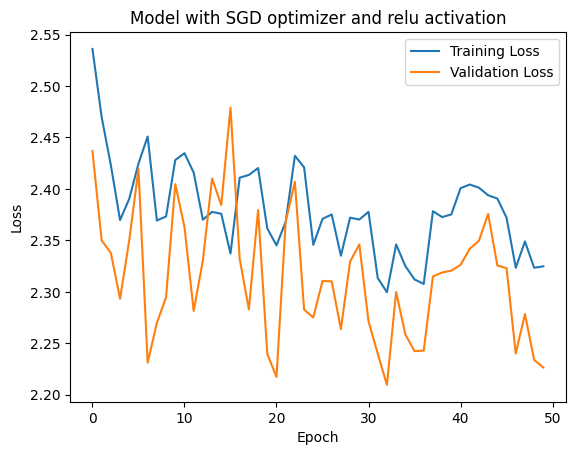

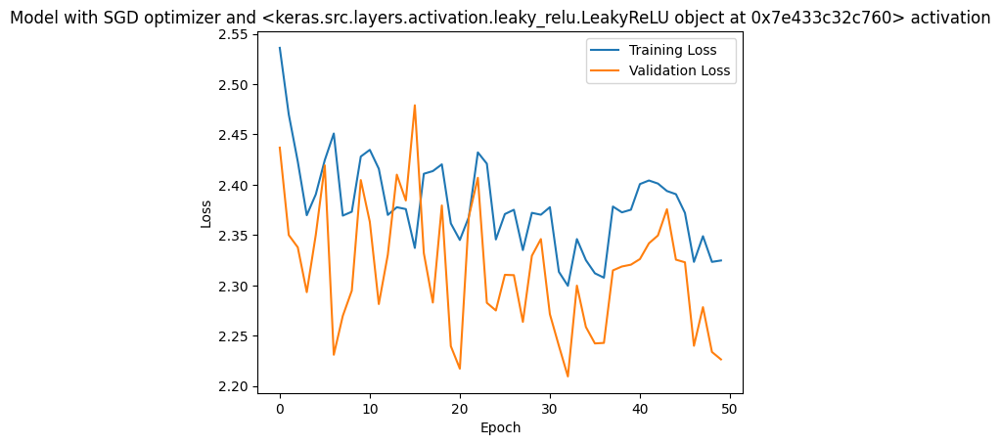

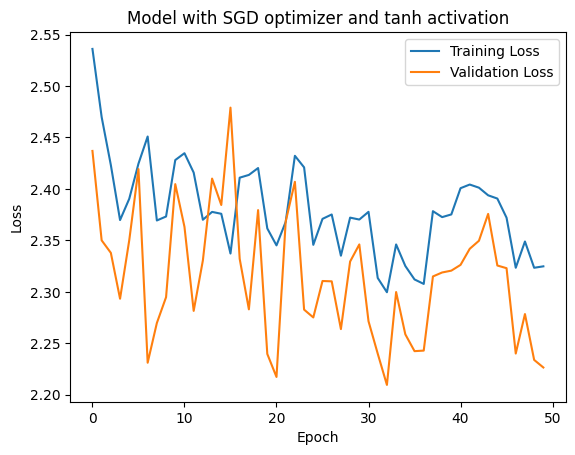

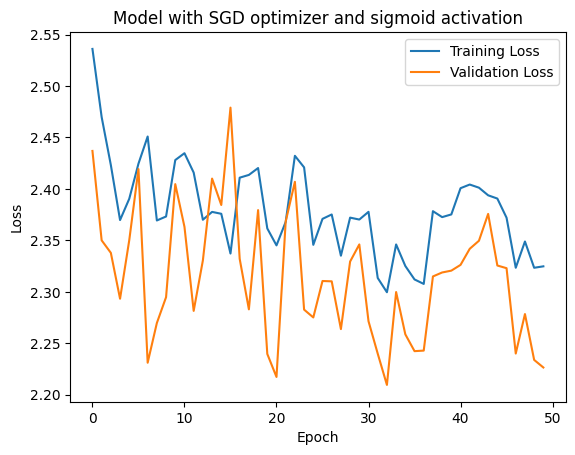

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


**SGD optimizer** and **ephocs=150** and **learning_rate=0.001**

---



In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
234/234 [==============================] - 3s 9ms/step - loss: 82.1694 - val_loss: 2.2576
Epoch 2/150
234/234 [==============================] - 2s 8ms/step - loss: 3.3497 - val_loss: 2.2219
Epoch 3/150
234/234 [==============================] - 2s 7ms/step - loss: 2.9259 - val_loss: 2.4696
Epoch 4/150
234/234 [==============================] - 1s 6ms/step - loss: 2.6759 - val_loss: 2.0071
Epoch 5/150
234/234 [==============================] - 1s 5ms/step - loss: 2.5790 - val_loss: 2.3009
Epoch 6/150
234/234 [==============================] - 1s 6ms/step - loss: 2.4760 - val_loss: 2.7042
Epoch 7/150
234/234 [==============================] - 1s 5ms/step - loss: 2.4357 - val_loss: 2.3292
Epoch 8/150
234/234 [==============================] - 1s 3ms/step - loss: 2.3795 - val_loss: 2.3072
Epoch 9/150
234/234 [==============================] - 1s 2ms/step - loss: 2.3480 - val_loss: 2.4189
Epoch 10/150
234/234 [==============================] - 1s 3ms/step - loss: 2.3257 - val_l

showing **some plots** with these changes

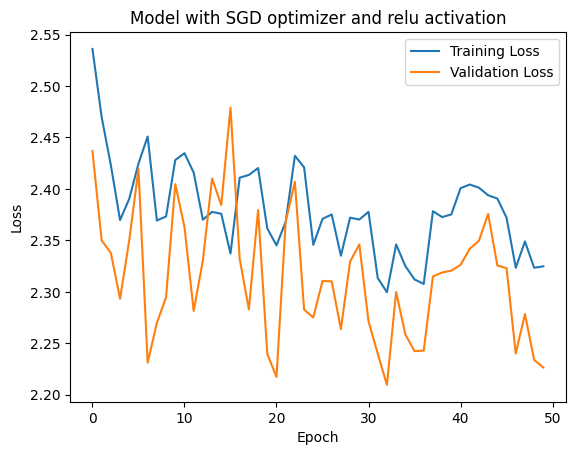

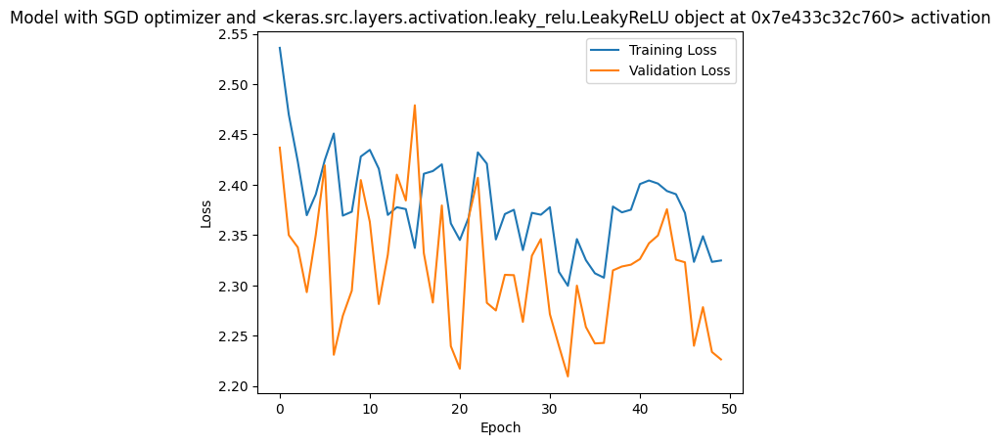

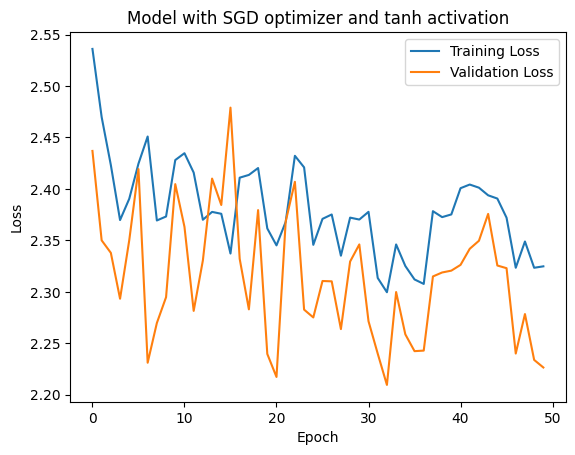

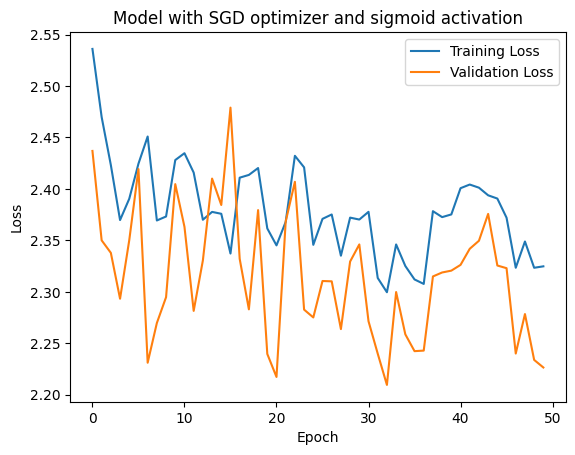

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


**SGD optimizer** and **ephocs=200** and **learning_rate=0.001**

---

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.SGD(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
234/234 [==============================] - 2s 5ms/step - loss: 230.3246 - val_loss: 3.0911
Epoch 2/200
234/234 [==============================] - 1s 4ms/step - loss: 3.2561 - val_loss: 3.2825
Epoch 3/200
234/234 [==============================] - 1s 4ms/step - loss: 2.9944 - val_loss: 2.2575
Epoch 4/200
234/234 [==============================] - 1s 3ms/step - loss: 2.8561 - val_loss: 2.1510
Epoch 5/200
234/234 [==============================] - 1s 2ms/step - loss: 2.6969 - val_loss: 2.1718
Epoch 6/200
234/234 [==============================] - 1s 3ms/step - loss: 2.5006 - val_loss: 2.0298
Epoch 7/200
234/234 [==============================] - 1s 4ms/step - loss: 2.4101 - val_loss: 2.1342
Epoch 8/200
234/234 [==============================] - 1s 3ms/step - loss: 2.3698 - val_loss: 2.2932
Epoch 9/200
234/234 [==============================] - 1s 2ms/step - loss: 2.3309 - val_loss: 2.0179
Epoch 10/200
234/234 [==============================] - 1s 3ms/step - loss: 2.5044 - val_

**Model with top 5/10/20 features.csv**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_5_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=150, batch_size=32, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1356/1356 [==============================] - 15s 7ms/step - loss: 1.8983 - val_loss: 1.7063
Epoch 2/150
1356/1356 [==============================] - 8s 6ms/step - loss: 1.7292 - val_loss: 1.5956
Epoch 3/150
1356/1356 [==============================] - 9s 6ms/step - loss: 1.6712 - val_loss: 1.5845
Epoch 4/150
1356/1356 [==============================] - 8s 6ms/step - loss: 1.6289 - val_loss: 1.5842
Epoch 5/150
1356/1356 [==============================] - 5s 4ms/step - loss: 1.6190 - val_loss: 1.5477
Epoch 6/150
1356/1356 [==============================] - 6s 4ms/step - loss: 1.5961 - val_loss: 1.5790
Epoch 7/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.5872 - val_loss: 1.5336
Epoch 8/150
1356/1356 [==============================] - 5s 4ms/step - loss: 1.5751 - val_loss: 1.5148
Epoch 9/150
1356/1356 [==============================] - 6s 4ms/step - loss: 1.5686 - val_loss: 1.5252
Epoch 10/150
1356/1356 [==============================] - 5s 4ms/step - 

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_10_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_10 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_10, X_test_scaled_10, y_train, y_test = train_test_split(X_scaled_10, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_10, y_train, epochs=150, batch_size=32, validation_data=(X_test_scaled_10, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_10, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1356/1356 [==============================] - 7s 4ms/step - loss: 1.7016 - val_loss: 1.4119
Epoch 2/150
1356/1356 [==============================] - 5s 4ms/step - loss: 1.4783 - val_loss: 1.3717
Epoch 3/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.4078 - val_loss: 1.3905
Epoch 4/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3813 - val_loss: 1.3359
Epoch 5/150
1356/1356 [==============================] - 5s 4ms/step - loss: 1.3522 - val_loss: 1.2955
Epoch 6/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3360 - val_loss: 1.3180
Epoch 7/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.3116 - val_loss: 1.2478
Epoch 8/150
1356/1356 [==============================] - 5s 4ms/step - loss: 1.2992 - val_loss: 1.2426
Epoch 9/150
1356/1356 [==============================] - 4s 3ms/step - loss: 1.2781 - val_loss: 1.3084
Epoch 10/150
1356/1356 [==============================] - 4s 3ms/step - l

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_20 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_20, X_test_scaled_20, y_train, y_test = train_test_split(X_scaled_20, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_20, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_20, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_20, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
678/678 [==============================] - 3s 4ms/step - loss: 1.7394 - val_loss: 1.4266
Epoch 2/200
678/678 [==============================] - 2s 3ms/step - loss: 1.5104 - val_loss: 1.3715
Epoch 3/200
678/678 [==============================] - 2s 2ms/step - loss: 1.4478 - val_loss: 1.3637
Epoch 4/200
678/678 [==============================] - 2s 3ms/step - loss: 1.4118 - val_loss: 1.2931
Epoch 5/200
678/678 [==============================] - 2s 3ms/step - loss: 1.3755 - val_loss: 1.2817
Epoch 6/200
678/678 [==============================] - 3s 4ms/step - loss: 1.3545 - val_loss: 1.2781
Epoch 7/200
678/678 [==============================] - 2s 2ms/step - loss: 1.3291 - val_loss: 1.2527
Epoch 8/200
678/678 [==============================] - 2s 2ms/step - loss: 1.3202 - val_loss: 1.2205
Epoch 9/200
678/678 [==============================] - 2s 3ms/step - loss: 1.3004 - val_loss: 1.2232
Epoch 10/200
678/678 [==============================] - 2s 2ms/step - loss: 1.2809 - val_lo

Awith **RMSprop (Root Mean Square Propagation) optimizer** and **learning_rate=0.001**


In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 8s 4ms/step - loss: 831.2172 - val_loss: 2.0308
Epoch 2/50
1695/1695 [==============================] - 5s 3ms/step - loss: 2.1522 - val_loss: 1.9523
Epoch 3/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.0578 - val_loss: 2.0996
Epoch 4/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.0574 - val_loss: 1.9110
Epoch 5/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.0495 - val_loss: 1.8657
Epoch 6/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.0673 - val_loss: 1.9003
Epoch 7/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.0323 - val_loss: 2.1126
Epoch 8/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0483 - val_loss: 2.0115
Epoch 9/50
1695/1695 [==============================] - 5s 3ms/step - loss: 2.0582 - val_loss: 1.8694
Epoch 10/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 9s 4ms/step - loss: 43.5845 - val_loss: 2.3472
Epoch 2/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.4254 - val_loss: 2.1172
Epoch 3/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.1649 - val_loss: 1.8921
Epoch 4/50
1695/1695 [==============================] - 8s 4ms/step - loss: 2.0635 - val_loss: 1.7514
Epoch 5/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0167 - val_loss: 1.9370
Epoch 6/50
1695/1695 [==============================] - 8s 5ms/step - loss: 1.9873 - val_loss: 1.7233
Epoch 7/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9369 - val_loss: 1.9513
Epoch 8/50
1695/1695 [==============================] - 8s 4ms/step - loss: 1.9109 - val_loss: 1.7221
Epoch 9/50
1695/1695 [==============================] - 8s 5ms/step - loss: 1.9299 - val_loss: 1.8403
Epoch 10/50
1695/1695 [==============================] - 6s 4ms/step - loss: 1.92

 **RMSprop optimizer** and **ephocs=100** and **Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
1695/1695 [==============================] - 16s 4ms/step - loss: 77.7946 - val_loss: 1.9832
Epoch 2/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1640 - val_loss: 1.8441
Epoch 3/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.0042 - val_loss: 1.8289
Epoch 4/100
1695/1695 [==============================] - 8s 4ms/step - loss: 1.8981 - val_loss: 1.8586
Epoch 5/100
1695/1695 [==============================] - 8s 5ms/step - loss: 1.8400 - val_loss: 1.7083
Epoch 6/100
1695/1695 [==============================] - 7s 4ms/step - loss: 1.8498 - val_loss: 1.8572
Epoch 7/100
1695/1695 [==============================] - 8s 5ms/step - loss: 1.8098 - val_loss: 1.8132
Epoch 8/100
1695/1695 [==============================] - 7s 4ms/step - loss: 1.7792 - val_loss: 1.6646
Epoch 9/100
1695/1695 [==============================] - 8s 5ms/step - loss: 1.7989 - val_loss: 1.6479
Epoch 10/100
1695/1695 [==============================] - 8s 4ms/step -

**RMSprop optimizer** and **ephocs=150** and **Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1695/1695 [==============================] - 9s 5ms/step - loss: 22.2265 - val_loss: 2.0667
Epoch 2/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9198 - val_loss: 2.1540
Epoch 3/150
1695/1695 [==============================] - 8s 5ms/step - loss: 1.8271 - val_loss: 1.9785
Epoch 4/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.7789 - val_loss: 1.9907
Epoch 5/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.7380 - val_loss: 1.8608
Epoch 6/150
1695/1695 [==============================] - 8s 5ms/step - loss: 1.6968 - val_loss: 1.5460
Epoch 7/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.6814 - val_loss: 1.7013
Epoch 8/150
1695/1695 [==============================] - 8s 4ms/step - loss: 1.6803 - val_loss: 1.6900
Epoch 9/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.6723 - val_loss: 1.5911
Epoch 10/150
1695/1695 [==============================] - 8s 5ms/step - 

**RMSprop optimizer** and **ephocs=200** and **Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
1243/1243 [==============================] - 11s 4ms/step - loss: 104.8982 - val_loss: 1.9558
Epoch 2/200
1243/1243 [==============================] - 6s 5ms/step - loss: 2.1809 - val_loss: 1.8643
Epoch 3/200
1243/1243 [==============================] - 6s 5ms/step - loss: 2.0622 - val_loss: 1.9147
Epoch 4/200
1243/1243 [==============================] - 5s 4ms/step - loss: 1.9854 - val_loss: 1.7985
Epoch 5/200
1243/1243 [==============================] - 6s 5ms/step - loss: 1.8787 - val_loss: 1.7947
Epoch 6/200
1243/1243 [==============================] - 5s 4ms/step - loss: 1.8521 - val_loss: 1.7885
Epoch 7/200
1243/1243 [==============================] - 6s 5ms/step - loss: 1.8423 - val_loss: 1.7101
Epoch 8/200
1243/1243 [==============================] - 5s 4ms/step - loss: 1.8387 - val_loss: 1.6811
Epoch 9/200
1243/1243 [==============================] - 6s 5ms/step - loss: 1.8527 - val_loss: 1.6783
Epoch 10/200
1243/1243 [==============================] - 5s 4ms/step 

with **Adagrad optimizer**  and **learning_rate=0.01** and **epochs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 8s 4ms/step - loss: 1211.0947 - val_loss: 2.6825
Epoch 2/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.7303 - val_loss: 2.0499
Epoch 3/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.2730 - val_loss: 2.0066
Epoch 4/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.1259 - val_loss: 2.0457
Epoch 5/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0872 - val_loss: 2.0431
Epoch 6/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.0274 - val_loss: 2.1021
Epoch 7/50
1695/1695 [==============================] - 8s 5ms/step - loss: 1.9830 - val_loss: 1.8921
Epoch 8/50
1695/1695 [==============================] - 6s 3ms/step - loss: 1.9576 - val_loss: 1.8494
Epoch 9/50
1695/1695 [==============================] - 6s 4ms/step - loss: 1.9604 - val_loss: 2.0069
Epoch 10/50
1695/1695 [==============================] - 6s 3ms/step - loss: 1.

with **Adagrad optimizer**  and **learning_rate=0.001** and **epochs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 9s 7ms/step - loss: 4319.8701 - val_loss: 704.4382
Epoch 2/50
156/156 [==============================] - 1s 6ms/step - loss: 1435.6394 - val_loss: 131.7302
Epoch 3/50
156/156 [==============================] - 1s 6ms/step - loss: 939.5502 - val_loss: 76.2635
Epoch 4/50
156/156 [==============================] - 1s 5ms/step - loss: 696.0831 - val_loss: 64.6274
Epoch 5/50
156/156 [==============================] - 1s 4ms/step - loss: 544.3754 - val_loss: 46.7089
Epoch 6/50
156/156 [==============================] - 1s 3ms/step - loss: 466.4247 - val_loss: 55.4904
Epoch 7/50
156/156 [==============================] - 1s 3ms/step - loss: 431.7932 - val_loss: 42.0407
Epoch 8/50
156/156 [==============================] - 1s 3ms/step - loss: 329.6674 - val_loss: 36.2773
Epoch 9/50
156/156 [==============================] - 1s 3ms/step - loss: 279.9424 - val_loss: 31.2236
Epoch 10/50
156/156 [==============================] - 1s 3ms/step - 

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 8s 4ms/step - loss: 57.3978 - val_loss: 2.1023
Epoch 2/50
1695/1695 [==============================] - 8s 5ms/step - loss: 2.2960 - val_loss: 2.0157
Epoch 3/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1719 - val_loss: 1.9429
Epoch 4/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1217 - val_loss: 1.9487
Epoch 5/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0673 - val_loss: 1.8663
Epoch 6/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0245 - val_loss: 1.8257
Epoch 7/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9901 - val_loss: 1.7772
Epoch 8/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9546 - val_loss: 1.7763
Epoch 9/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9286 - val_loss: 1.7059
Epoch 10/50
1695/1695 [==============================] - 6s 4ms/step - loss: 1.89

**Layer=4, Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 4s 10ms/step - loss: 1755.7681 - val_loss: 48.2769
Epoch 2/50
156/156 [==============================] - 1s 6ms/step - loss: 273.5452 - val_loss: 13.4531
Epoch 3/50
156/156 [==============================] - 1s 6ms/step - loss: 133.0826 - val_loss: 9.6472
Epoch 4/50
156/156 [==============================] - 1s 6ms/step - loss: 95.8173 - val_loss: 7.0809
Epoch 5/50
156/156 [==============================] - 1s 6ms/step - loss: 60.9230 - val_loss: 5.6510
Epoch 6/50
156/156 [==============================] - 1s 6ms/step - loss: 44.1927 - val_loss: 7.6745
Epoch 7/50
156/156 [==============================] - 1s 6ms/step - loss: 31.7719 - val_loss: 6.0400
Epoch 8/50
156/156 [==============================] - 1s 6ms/step - loss: 23.1771 - val_loss: 5.3052
Epoch 9/50
156/156 [==============================] - 1s 6ms/step - loss: 18.7543 - val_loss: 5.6861
Epoch 10/50
156/156 [==============================] - 1s 6ms/step - loss: 13.6905 -

with just **AdaGrad optimizer** and **ephocs=100** and**Learning_rate=0.01**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
1695/1695 [==============================] - 9s 5ms/step - loss: 43.6352 - val_loss: 2.3158
Epoch 2/100
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1662 - val_loss: 2.3524
Epoch 3/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.0559 - val_loss: 2.1069
Epoch 4/100
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9969 - val_loss: 2.1120
Epoch 5/100
1695/1695 [==============================] - 8s 4ms/step - loss: 1.9443 - val_loss: 1.9058
Epoch 6/100
1695/1695 [==============================] - 7s 4ms/step - loss: 1.8859 - val_loss: 1.9598
Epoch 7/100
1695/1695 [==============================] - 8s 5ms/step - loss: 1.8276 - val_loss: 1.9033
Epoch 8/100
1695/1695 [==============================] - 8s 4ms/step - loss: 1.7804 - val_loss: 1.8380
Epoch 9/100
1695/1695 [==============================] - 7s 4ms/step - loss: 1.7420 - val_loss: 1.7869
Epoch 10/100
1695/1695 [==============================] - 8s 5ms/step - 

with just **AdaGrad optimizer** and **ephocs=100** and**Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
156/156 [==============================] - 3s 7ms/step - loss: 4220.6289 - val_loss: 93.2513
Epoch 2/100
156/156 [==============================] - 2s 10ms/step - loss: 685.2933 - val_loss: 26.6998
Epoch 3/100
156/156 [==============================] - 1s 8ms/step - loss: 346.0970 - val_loss: 12.4600
Epoch 4/100
156/156 [==============================] - 1s 6ms/step - loss: 225.6066 - val_loss: 9.8333
Epoch 5/100
156/156 [==============================] - 1s 6ms/step - loss: 153.1805 - val_loss: 8.2950
Epoch 6/100
156/156 [==============================] - 1s 6ms/step - loss: 100.2874 - val_loss: 6.2283
Epoch 7/100
156/156 [==============================] - 1s 6ms/step - loss: 74.6011 - val_loss: 6.9313
Epoch 8/100
156/156 [==============================] - 1s 6ms/step - loss: 55.8498 - val_loss: 4.8827
Epoch 9/100
156/156 [==============================] - 1s 6ms/step - loss: 50.5203 - val_loss: 6.0978
Epoch 10/100
156/156 [==============================] - 1s 6ms/step - l

with just **AdaGrad optimizer** and **ephocs=150**and **learning_rate=0.01**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1695/1695 [==============================] - 8s 4ms/step - loss: 149.7841 - val_loss: 2.2796
Epoch 2/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.2181 - val_loss: 2.1130
Epoch 3/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1332 - val_loss: 2.0701
Epoch 4/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0671 - val_loss: 1.9960
Epoch 5/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.0189 - val_loss: 1.9724
Epoch 6/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9751 - val_loss: 1.9607
Epoch 7/150
1695/1695 [==============================] - 8s 5ms/step - loss: 1.9358 - val_loss: 1.9594
Epoch 8/150
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9048 - val_loss: 1.9198
Epoch 9/150
1695/1695 [==============================] - 8s 5ms/step - loss: 1.8718 - val_loss: 1.9335
Epoch 10/150
1695/1695 [==============================] - 8s 5ms/step -

with just **AdaGrad optimizer** and **ephocs=100**and **learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
1695/1695 [==============================] - 12s 5ms/step - loss: 81.4237 - val_loss: 3.2252
Epoch 2/100
1695/1695 [==============================] - 11s 6ms/step - loss: 4.2073 - val_loss: 3.1617
Epoch 3/100
1695/1695 [==============================] - 8s 5ms/step - loss: 3.9436 - val_loss: 3.0891
Epoch 4/100
1695/1695 [==============================] - 8s 5ms/step - loss: 3.6000 - val_loss: 2.9601
Epoch 5/100
1695/1695 [==============================] - 8s 5ms/step - loss: 3.4829 - val_loss: 2.9050
Epoch 6/100
1695/1695 [==============================] - 7s 4ms/step - loss: 3.4883 - val_loss: 2.8429
Epoch 7/100
1695/1695 [==============================] - 8s 5ms/step - loss: 3.3568 - val_loss: 2.8647
Epoch 8/100
1695/1695 [==============================] - 7s 4ms/step - loss: 3.3568 - val_loss: 2.7308
Epoch 9/100
1695/1695 [==============================] - 8s 5ms/step - loss: 3.3602 - val_loss: 2.6928
Epoch 10/100
1695/1695 [==============================] - 8s 4ms/step 

with just **AdaGrad optimizer** and **ephocs=150**and **learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1695/1695 [==============================] - 8s 4ms/step - loss: 83.1755 - val_loss: 3.1539
Epoch 2/150
1695/1695 [==============================] - 8s 5ms/step - loss: 3.8604 - val_loss: 2.8726
Epoch 3/150
1695/1695 [==============================] - 7s 4ms/step - loss: 3.3162 - val_loss: 2.7079
Epoch 4/150
1695/1695 [==============================] - 8s 5ms/step - loss: 3.0132 - val_loss: 2.5296
Epoch 5/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.9356 - val_loss: 2.5016
Epoch 6/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.8115 - val_loss: 2.5180
Epoch 7/150
1695/1695 [==============================] - 8s 4ms/step - loss: 2.7741 - val_loss: 2.5471
Epoch 8/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.6629 - val_loss: 2.4391
Epoch 9/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.6798 - val_loss: 2.4760
Epoch 10/150
1695/1695 [==============================] - 7s 4ms/step - 

with just **AdaGrad optimizer** and **ephocs=200**and **learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
custom_optimizer = tf.keras.optimizers.Adagrad(learning_rate=0.001, clipvalue=1.0)  # Adjust the learning rate
model.compile(optimizer=custom_optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
156/156 [==============================] - 2s 6ms/step - loss: 3162.1711 - val_loss: 72.3861
Epoch 2/200
156/156 [==============================] - 1s 6ms/step - loss: 421.8398 - val_loss: 28.6739
Epoch 3/200
156/156 [==============================] - 1s 7ms/step - loss: 189.8905 - val_loss: 8.4071
Epoch 4/200
156/156 [==============================] - 1s 8ms/step - loss: 86.9416 - val_loss: 6.7738
Epoch 5/200
156/156 [==============================] - 1s 8ms/step - loss: 47.9280 - val_loss: 5.3653
Epoch 6/200
156/156 [==============================] - 2s 10ms/step - loss: 25.9172 - val_loss: 4.4189
Epoch 7/200
156/156 [==============================] - 2s 12ms/step - loss: 14.0114 - val_loss: 4.7721
Epoch 8/200
156/156 [==============================] - 1s 8ms/step - loss: 8.0509 - val_loss: 4.4225
Epoch 9/200
156/156 [==============================] - 2s 10ms/step - loss: 6.5978 - val_loss: 3.9241
Epoch 10/200
156/156 [==============================] - 2s 10ms/step - loss

with **Adadelta optimizer** and **learning_rate=1.0**and **ephocs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=1.0, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 8s 4ms/step - loss: 1141.3578 - val_loss: 3.2041
Epoch 2/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.6127 - val_loss: 2.3768
Epoch 3/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.5506 - val_loss: 2.2948
Epoch 4/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.4416 - val_loss: 2.4326
Epoch 5/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.4913 - val_loss: 2.2710
Epoch 6/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.4453 - val_loss: 2.3646
Epoch 7/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.4520 - val_loss: 2.3712
Epoch 8/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.4174 - val_loss: 2.3496
Epoch 9/50
1695/1695 [==============================] - 6s 4ms/step - loss: 2.4636 - val_loss: 2.4548
Epoch 10/50
1695/1695 [==============================] - 6s 3ms/step - loss: 2.

**layer=2** and **Learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 3s 7ms/step - loss: 18316.4258 - val_loss: 3536.2170
Epoch 2/50
156/156 [==============================] - 1s 7ms/step - loss: 14997.2764 - val_loss: 2129.7834
Epoch 3/50
156/156 [==============================] - 1s 6ms/step - loss: 13533.1416 - val_loss: 1751.8224
Epoch 4/50
156/156 [==============================] - 1s 4ms/step - loss: 12502.5225 - val_loss: 1666.3163
Epoch 5/50
156/156 [==============================] - 1s 5ms/step - loss: 11758.5527 - val_loss: 1632.6436
Epoch 6/50
156/156 [==============================] - 1s 10ms/step - loss: 11465.9082 - val_loss: 1537.2372
Epoch 7/50
156/156 [==============================] - 1s 9ms/step - loss: 11233.9854 - val_loss: 1422.7924
Epoch 8/50
156/156 [==============================] - 1s 7ms/step - loss: 10531.8887 - val_loss: 1311.7280
Epoch 9/50
156/156 [==============================] - 1s 7ms/step - loss: 10143.3115 - val_loss: 1170.5604
Epoch 10/50
156/156 [===============

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=1.0, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
1695/1695 [==============================] - 10s 5ms/step - loss: 24.1335 - val_loss: 2.3697
Epoch 2/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.3721 - val_loss: 2.1728
Epoch 3/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.2498 - val_loss: 2.0700
Epoch 4/50
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1630 - val_loss: 2.0275
Epoch 5/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1188 - val_loss: 1.9495
Epoch 6/50
1695/1695 [==============================] - 8s 5ms/step - loss: 2.0553 - val_loss: 1.9944
Epoch 7/50
1695/1695 [==============================] - 7s 4ms/step - loss: 2.0174 - val_loss: 1.8543
Epoch 8/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9940 - val_loss: 1.7995
Epoch 9/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9481 - val_loss: 1.9045
Epoch 10/50
1695/1695 [==============================] - 7s 4ms/step - loss: 1.9

**layer=4** and **Learning_rate=0.001**and **epochs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 3s 8ms/step - loss: 7727.6680 - val_loss: 4107.8521
Epoch 2/50
156/156 [==============================] - 1s 7ms/step - loss: 6326.9619 - val_loss: 2635.7964
Epoch 3/50
156/156 [==============================] - 1s 7ms/step - loss: 5553.5464 - val_loss: 1577.1128
Epoch 4/50
156/156 [==============================] - 1s 7ms/step - loss: 4731.6680 - val_loss: 917.7041
Epoch 5/50
156/156 [==============================] - 1s 8ms/step - loss: 4238.6396 - val_loss: 485.3226
Epoch 6/50
156/156 [==============================] - 1s 6ms/step - loss: 3936.9690 - val_loss: 250.6287
Epoch 7/50
156/156 [==============================] - 1s 5ms/step - loss: 3341.0686 - val_loss: 119.9485
Epoch 8/50
156/156 [==============================] - 1s 6ms/step - loss: 3192.8467 - val_loss: 73.5618
Epoch 9/50
156/156 [==============================] - 1s 5ms/step - loss: 3040.6401 - val_loss: 96.3122
Epoch 10/50
156/156 [==============================] -

with just **Adadelta optimizer** and **ephocs=100**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=1.0, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
1695/1695 [==============================] - 13s 5ms/step - loss: 28.7557 - val_loss: 2.3877
Epoch 2/100
1695/1695 [==============================] - 9s 5ms/step - loss: 2.5324 - val_loss: 2.4256
Epoch 3/100
1695/1695 [==============================] - 7s 4ms/step - loss: 2.5862 - val_loss: 2.4184
Epoch 4/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.5040 - val_loss: 2.2871
Epoch 5/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.4962 - val_loss: 2.3149
Epoch 6/100
1695/1695 [==============================] - 7s 4ms/step - loss: 2.3449 - val_loss: 2.0450
Epoch 7/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.2463 - val_loss: 2.1570
Epoch 8/100
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1970 - val_loss: 2.0057
Epoch 9/100
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1153 - val_loss: 2.0223
Epoch 10/100
1695/1695 [==============================] - 8s 5ms/step -

**Learnin_rate=0.001** and **ephocs=100**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
156/156 [==============================] - 4s 12ms/step - loss: 6960.1841 - val_loss: 589.5483
Epoch 2/100
156/156 [==============================] - 2s 10ms/step - loss: 6192.0649 - val_loss: 553.8802
Epoch 3/100
156/156 [==============================] - 1s 7ms/step - loss: 5095.2695 - val_loss: 787.0367
Epoch 4/100
156/156 [==============================] - 1s 6ms/step - loss: 4563.5205 - val_loss: 915.6962
Epoch 5/100
156/156 [==============================] - 1s 5ms/step - loss: 4134.5518 - val_loss: 932.2567
Epoch 6/100
156/156 [==============================] - 1s 5ms/step - loss: 3740.9919 - val_loss: 818.3007
Epoch 7/100
156/156 [==============================] - 1s 6ms/step - loss: 3438.5642 - val_loss: 720.9777
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 2889.7429 - val_loss: 626.2997
Epoch 9/100
156/156 [==============================] - 1s 4ms/step - loss: 2641.6941 - val_loss: 509.1497
Epoch 10/100
156/156 [======================

with just **Adadelta optimizer** and **ephocs=150**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=1.0, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
1695/1695 [==============================] - 10s 5ms/step - loss: 51.9181 - val_loss: 2.2160
Epoch 2/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.3385 - val_loss: 2.2352
Epoch 3/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.2786 - val_loss: 2.1091
Epoch 4/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.2528 - val_loss: 1.9908
Epoch 5/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1702 - val_loss: 2.1296
Epoch 6/150
1695/1695 [==============================] - 9s 5ms/step - loss: 2.1443 - val_loss: 2.0186
Epoch 7/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1643 - val_loss: 2.0156
Epoch 8/150
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1345 - val_loss: 1.9233
Epoch 9/150
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1261 - val_loss: 1.9566
Epoch 10/150
1695/1695 [==============================] - 8s 4ms/step -

**Learning_rate=0.001** and **epochs=150**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
156/156 [==============================] - 4s 9ms/step - loss: 53952.7266 - val_loss: 39085.4336
Epoch 2/150
156/156 [==============================] - 1s 6ms/step - loss: 44683.6445 - val_loss: 29640.9688
Epoch 3/150
156/156 [==============================] - 1s 6ms/step - loss: 35249.5625 - val_loss: 21134.4512
Epoch 4/150
156/156 [==============================] - 1s 6ms/step - loss: 27932.8613 - val_loss: 13865.6660
Epoch 5/150
156/156 [==============================] - 1s 6ms/step - loss: 21690.4141 - val_loss: 8083.0723
Epoch 6/150
156/156 [==============================] - 1s 7ms/step - loss: 15550.4482 - val_loss: 4074.5522
Epoch 7/150
156/156 [==============================] - 1s 6ms/step - loss: 12010.2686 - val_loss: 1989.9758
Epoch 8/150
156/156 [==============================] - 1s 7ms/step - loss: 8523.5713 - val_loss: 1090.7759
Epoch 9/150
156/156 [==============================] - 1s 7ms/step - loss: 7043.7886 - val_loss: 882.8627
Epoch 10/150
156/156 [=====

with just **Adadelta optimizer** and **ephocs=200**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=1.0, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
1695/1695 [==============================] - 13s 5ms/step - loss: 25.9955 - val_loss: 2.2526
Epoch 2/200
1695/1695 [==============================] - 7s 4ms/step - loss: 2.4667 - val_loss: 2.2473
Epoch 3/200
1695/1695 [==============================] - 8s 5ms/step - loss: 2.3186 - val_loss: 2.0958
Epoch 4/200
1695/1695 [==============================] - 7s 4ms/step - loss: 2.2339 - val_loss: 2.0889
Epoch 5/200
1695/1695 [==============================] - 8s 5ms/step - loss: 2.1924 - val_loss: 2.0367
Epoch 6/200
1695/1695 [==============================] - 8s 4ms/step - loss: 2.1555 - val_loss: 1.9154
Epoch 7/200
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1304 - val_loss: 1.9953
Epoch 8/200
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1053 - val_loss: 1.9448
Epoch 9/200
1695/1695 [==============================] - 7s 4ms/step - loss: 2.1076 - val_loss: 1.9199
Epoch 10/200
1695/1695 [==============================] - 8s 5ms/step -

**Learning_rate=0.001** and **epochs=200**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
156/156 [==============================] - 4s 8ms/step - loss: 120875.1406 - val_loss: 69438.5625
Epoch 2/200
156/156 [==============================] - 1s 6ms/step - loss: 108532.6953 - val_loss: 55327.8594
Epoch 3/200
156/156 [==============================] - 1s 6ms/step - loss: 90946.7812 - val_loss: 41810.5781
Epoch 4/200
156/156 [==============================] - 1s 8ms/step - loss: 75667.6016 - val_loss: 29589.2695
Epoch 5/200
156/156 [==============================] - 1s 5ms/step - loss: 63058.2617 - val_loss: 19288.5586
Epoch 6/200
156/156 [==============================] - 1s 5ms/step - loss: 49389.0898 - val_loss: 11395.4502
Epoch 7/200
156/156 [==============================] - 1s 5ms/step - loss: 38508.2422 - val_loss: 6004.0845
Epoch 8/200
156/156 [==============================] - 1s 7ms/step - loss: 26319.0527 - val_loss: 2901.6858
Epoch 9/200
156/156 [==============================] - 1s 6ms/step - loss: 20637.7500 - val_loss: 1789.5854
Epoch 10/200
156/156

**model with top 5/10/20 features.csv**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_5_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
678/678 [==============================] - 8s 8ms/step - loss: 5.7326 - val_loss: 4.2768
Epoch 2/200
678/678 [==============================] - 7s 10ms/step - loss: 2.8951 - val_loss: 2.0765
Epoch 3/200
678/678 [==============================] - 5s 7ms/step - loss: 2.2952 - val_loss: 1.9164
Epoch 4/200
678/678 [==============================] - 4s 7ms/step - loss: 2.1825 - val_loss: 1.8570
Epoch 5/200
678/678 [==============================] - 6s 9ms/step - loss: 2.1068 - val_loss: 1.8225
Epoch 6/200
678/678 [==============================] - 4s 6ms/step - loss: 2.0684 - val_loss: 1.8008
Epoch 7/200
678/678 [==============================] - 4s 6ms/step - loss: 2.0386 - val_loss: 1.7858
Epoch 8/200
678/678 [==============================] - 5s 7ms/step - loss: 2.0251 - val_loss: 1.7754
Epoch 9/200
678/678 [==============================] - 4s 5ms/step - loss: 1.9960 - val_loss: 1.7667
Epoch 10/200
678/678 [==============================] - 5s 7ms/step - loss: 1.9724 - val_l

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_10_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_10 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_10, X_test_scaled_10, y_train, y_test = train_test_split(X_scaled_10, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_10, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_10, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_10, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_20 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_20, X_test_scaled_20, y_train, y_test = train_test_split(X_scaled_20, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_20, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_20, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_20, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
678/678 [==============================] - 4s 4ms/step - loss: 4.8558 - val_loss: 2.9889
Epoch 2/200
678/678 [==============================] - 3s 4ms/step - loss: 2.7139 - val_loss: 2.1908
Epoch 3/200
678/678 [==============================] - 2s 3ms/step - loss: 2.3400 - val_loss: 1.9725
Epoch 4/200
678/678 [==============================] - 2s 3ms/step - loss: 2.1864 - val_loss: 1.8481
Epoch 5/200
678/678 [==============================] - 2s 3ms/step - loss: 2.0605 - val_loss: 1.7623
Epoch 6/200
678/678 [==============================] - 2s 3ms/step - loss: 1.9878 - val_loss: 1.7062
Epoch 7/200
678/678 [==============================] - 4s 5ms/step - loss: 1.9179 - val_loss: 1.6624
Epoch 8/200
678/678 [==============================] - 2s 3ms/step - loss: 1.8771 - val_loss: 1.6286
Epoch 9/200
678/678 [==============================] - 2s 3ms/step - loss: 1.8501 - val_loss: 1.6096
Epoch 10/200
678/678 [==============================] - 2s 3ms/step - loss: 1.8198 - val_lo

with **FTRL (Follow The Regularized Leader) optimizer** and **learning_rate=0.01**



In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
117/117 [==============================] - 6s 16ms/step - loss: 5509.5547 - val_loss: 125.3337
Epoch 2/50
117/117 [==============================] - 2s 14ms/step - loss: 43.5187 - val_loss: 9.2300
Epoch 3/50
117/117 [==============================] - 1s 13ms/step - loss: 10.2010 - val_loss: 3.6357
Epoch 4/50
117/117 [==============================] - 1s 11ms/step - loss: 4.4233 - val_loss: 2.2239
Epoch 5/50
117/117 [==============================] - 1s 12ms/step - loss: 3.0134 - val_loss: 2.1158
Epoch 6/50
117/117 [==============================] - 2s 15ms/step - loss: 2.7187 - val_loss: 2.4409
Epoch 7/50
117/117 [==============================] - 2s 14ms/step - loss: 2.6662 - val_loss: 2.2421
Epoch 8/50
117/117 [==============================] - 1s 10ms/step - loss: 2.4373 - val_loss: 2.0882
Epoch 9/50
117/117 [==============================] - 1s 7ms/step - loss: 2.3689 - val_loss: 2.0927
Epoch 10/50
117/117 [==============================] - 1s 8ms/step - loss: 2.2614 - v

**learning_rate=0.001** and **ephocs=50**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 4s 10ms/step - loss: 1528.2003 - val_loss: 31.3048
Epoch 2/50
156/156 [==============================] - 1s 7ms/step - loss: 161.1283 - val_loss: 6.5614
Epoch 3/50
156/156 [==============================] - 1s 5ms/step - loss: 86.5505 - val_loss: 7.6066
Epoch 4/50
156/156 [==============================] - 1s 4ms/step - loss: 62.6804 - val_loss: 4.7040
Epoch 5/50
156/156 [==============================] - 1s 4ms/step - loss: 49.8085 - val_loss: 5.9829
Epoch 6/50
156/156 [==============================] - 1s 4ms/step - loss: 39.2404 - val_loss: 4.9357
Epoch 7/50
156/156 [==============================] - 1s 7ms/step - loss: 31.9038 - val_loss: 5.8730
Epoch 8/50
156/156 [==============================] - 1s 6ms/step - loss: 27.7927 - val_loss: 4.0159
Epoch 9/50
156/156 [==============================] - 1s 4ms/step - loss: 25.5680 - val_loss: 3.8142
Epoch 10/50
156/156 [==============================] - 1s 4ms/step - loss: 21.1323 - v

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
117/117 [==============================] - 3s 7ms/step - loss: 43.9036 - val_loss: 2.8986
Epoch 2/50
117/117 [==============================] - 1s 6ms/step - loss: 2.7927 - val_loss: 2.1564
Epoch 3/50
117/117 [==============================] - 1s 5ms/step - loss: 2.5701 - val_loss: 2.1374
Epoch 4/50
117/117 [==============================] - 1s 6ms/step - loss: 2.4816 - val_loss: 2.1803
Epoch 5/50
117/117 [==============================] - 1s 5ms/step - loss: 2.4323 - val_loss: 2.2540
Epoch 6/50
117/117 [==============================] - 1s 6ms/step - loss: 2.4101 - val_loss: 2.1281
Epoch 7/50
117/117 [==============================] - 1s 6ms/step - loss: 2.3272 - val_loss: 2.2150
Epoch 8/50
117/117 [==============================] - 1s 6ms/step - loss: 2.3241 - val_loss: 2.1447
Epoch 9/50
117/117 [==============================] - 1s 6ms/step - loss: 2.2723 - val_loss: 2.0424
Epoch 10/50
117/117 [==============================] - 1s 8ms/step - loss: 2.2458 - val_loss: 2.049

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 6s 18ms/step - loss: 67.6824 - val_loss: 4.6774
Epoch 2/50
156/156 [==============================] - 2s 14ms/step - loss: 6.0117 - val_loss: 3.7890
Epoch 3/50
156/156 [==============================] - 1s 7ms/step - loss: 4.6132 - val_loss: 3.3488
Epoch 4/50
156/156 [==============================] - 1s 7ms/step - loss: 4.1998 - val_loss: 3.1668
Epoch 5/50
156/156 [==============================] - 1s 7ms/step - loss: 3.7762 - val_loss: 2.9414
Epoch 6/50
156/156 [==============================] - 1s 8ms/step - loss: 3.6003 - val_loss: 2.8632
Epoch 7/50
156/156 [==============================] - 1s 7ms/step - loss: 3.3789 - val_loss: 2.8298
Epoch 8/50
156/156 [==============================] - 1s 7ms/step - loss: 3.3339 - val_loss: 2.6917
Epoch 9/50
156/156 [==============================] - 1s 7ms/step - loss: 3.1747 - val_loss: 2.6788
Epoch 10/50
156/156 [==============================] - 2s 10ms/step - loss: 3.1923 - val_loss: 2.

with just **Ftrl optimizer** and **ephocs=100** and **learning_rate=0.01**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
117/117 [==============================] - 5s 15ms/step - loss: 146.5608 - val_loss: 2.5534
Epoch 2/100
117/117 [==============================] - 1s 10ms/step - loss: 2.9315 - val_loss: 2.4276
Epoch 3/100
117/117 [==============================] - 1s 11ms/step - loss: 2.6182 - val_loss: 2.4361
Epoch 4/100
117/117 [==============================] - 1s 9ms/step - loss: 2.5034 - val_loss: 2.3211
Epoch 5/100
117/117 [==============================] - 2s 14ms/step - loss: 2.3914 - val_loss: 2.4323
Epoch 6/100
117/117 [==============================] - 1s 11ms/step - loss: 2.3762 - val_loss: 2.5220
Epoch 7/100
117/117 [==============================] - 1s 11ms/step - loss: 2.3295 - val_loss: 2.0750
Epoch 8/100
117/117 [==============================] - 1s 10ms/step - loss: 2.2944 - val_loss: 2.1751
Epoch 9/100
117/117 [==============================] - 1s 10ms/step - loss: 2.2822 - val_loss: 2.3854
Epoch 10/100
117/117 [==============================] - 1s 10ms/step - loss: 2.25

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
156/156 [==============================] - 4s 8ms/step - loss: 91.3583 - val_loss: 4.2055
Epoch 2/100
156/156 [==============================] - 1s 6ms/step - loss: 5.4643 - val_loss: 3.5924
Epoch 3/100
156/156 [==============================] - 1s 6ms/step - loss: 4.5942 - val_loss: 3.0949
Epoch 4/100
156/156 [==============================] - 1s 8ms/step - loss: 4.1443 - val_loss: 3.1018
Epoch 5/100
156/156 [==============================] - 1s 9ms/step - loss: 3.9611 - val_loss: 2.8577
Epoch 6/100
156/156 [==============================] - 1s 8ms/step - loss: 3.7405 - val_loss: 2.7431
Epoch 7/100
156/156 [==============================] - 1s 6ms/step - loss: 3.5703 - val_loss: 2.7103
Epoch 8/100
156/156 [==============================] - 1s 7ms/step - loss: 3.4625 - val_loss: 2.7028
Epoch 9/100
156/156 [==============================] - 1s 6ms/step - loss: 3.3204 - val_loss: 2.6433
Epoch 10/100
156/156 [==============================] - 1s 9ms/step - loss: 3.2734 - val_l

with just **Ftrl optimizer** and **ephocs=150** and **learning_rate=0.01**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
117/117 [==============================] - 5s 11ms/step - loss: 485.3687 - val_loss: 2.2826
Epoch 2/150
117/117 [==============================] - 1s 8ms/step - loss: 2.7396 - val_loss: 2.3633
Epoch 3/150
117/117 [==============================] - 1s 10ms/step - loss: 2.5735 - val_loss: 2.7325
Epoch 4/150
117/117 [==============================] - 1s 10ms/step - loss: 2.4689 - val_loss: 2.4154
Epoch 5/150
117/117 [==============================] - 1s 8ms/step - loss: 2.3720 - val_loss: 2.6294
Epoch 6/150
117/117 [==============================] - 1s 6ms/step - loss: 2.3559 - val_loss: 2.2796
Epoch 7/150
117/117 [==============================] - 1s 9ms/step - loss: 2.3287 - val_loss: 2.4377
Epoch 8/150
117/117 [==============================] - 1s 11ms/step - loss: 2.2464 - val_loss: 2.4490
Epoch 9/150
117/117 [==============================] - 2s 13ms/step - loss: 2.2543 - val_loss: 2.1994
Epoch 10/150
117/117 [==============================] - 2s 13ms/step - loss: 2.2357 

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
156/156 [==============================] - 3s 8ms/step - loss: 75.7197 - val_loss: 3.0429
Epoch 2/150
156/156 [==============================] - 1s 6ms/step - loss: 6.3377 - val_loss: 2.7205
Epoch 3/150
156/156 [==============================] - 1s 6ms/step - loss: 4.8831 - val_loss: 2.8319
Epoch 4/150
156/156 [==============================] - 1s 6ms/step - loss: 4.4612 - val_loss: 2.6745
Epoch 5/150
156/156 [==============================] - 1s 8ms/step - loss: 4.0392 - val_loss: 2.7707
Epoch 6/150
156/156 [==============================] - 1s 9ms/step - loss: 3.7020 - val_loss: 2.7504
Epoch 7/150
156/156 [==============================] - 1s 8ms/step - loss: 3.6383 - val_loss: 2.6539
Epoch 8/150
156/156 [==============================] - 1s 6ms/step - loss: 3.2959 - val_loss: 2.7087
Epoch 9/150
156/156 [==============================] - 1s 6ms/step - loss: 3.2449 - val_loss: 2.5512
Epoch 10/150
156/156 [==============================] - 1s 6ms/step - loss: 3.1993 - val_l

with just **Ftrl optimizer** and **ephocs=150** and **learning_rate=0.01** and **batch_size=64**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=64, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
59/59 [==============================] - 2s 10ms/step - loss: 666.4945 - val_loss: 2.7517
Epoch 2/150
59/59 [==============================] - 0s 7ms/step - loss: 2.9116 - val_loss: 2.1924
Epoch 3/150
59/59 [==============================] - 0s 7ms/step - loss: 2.7012 - val_loss: 2.1547
Epoch 4/150
59/59 [==============================] - 0s 6ms/step - loss: 2.5521 - val_loss: 2.5637
Epoch 5/150
59/59 [==============================] - 0s 6ms/step - loss: 2.5516 - val_loss: 2.1116
Epoch 6/150
59/59 [==============================] - 0s 6ms/step - loss: 2.4798 - val_loss: 2.1869
Epoch 7/150
59/59 [==============================] - 0s 6ms/step - loss: 2.3753 - val_loss: 2.5629
Epoch 8/150
59/59 [==============================] - 0s 7ms/step - loss: 2.3728 - val_loss: 2.0349
Epoch 9/150
59/59 [==============================] - 0s 7ms/step - loss: 2.3146 - val_loss: 2.5275
Epoch 10/150
59/59 [==============================] - 0s 6ms/step - loss: 2.3067 - val_loss: 2.2341
Epoch 

with just **Ftrl optimizer** and **ephocs=200** and **learning_rate=0.01** and **batch_size=64**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=64, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
59/59 [==============================] - 2s 10ms/step - loss: 396.5615 - val_loss: 2.6751
Epoch 2/200
59/59 [==============================] - 0s 6ms/step - loss: 2.7244 - val_loss: 2.3293
Epoch 3/200
59/59 [==============================] - 0s 6ms/step - loss: 2.5413 - val_loss: 2.7684
Epoch 4/200
59/59 [==============================] - 0s 7ms/step - loss: 2.4421 - val_loss: 2.3026
Epoch 5/200
59/59 [==============================] - 0s 6ms/step - loss: 2.4251 - val_loss: 2.0702
Epoch 6/200
59/59 [==============================] - 0s 6ms/step - loss: 2.3227 - val_loss: 2.2511
Epoch 7/200
59/59 [==============================] - 0s 6ms/step - loss: 2.3328 - val_loss: 2.0292
Epoch 8/200
59/59 [==============================] - 0s 6ms/step - loss: 2.2901 - val_loss: 2.1147
Epoch 9/200
59/59 [==============================] - 0s 6ms/step - loss: 2.2674 - val_loss: 2.4272
Epoch 10/200
59/59 [==============================] - 0s 6ms/step - loss: 2.1985 - val_loss: 2.0506
Epoch 

with just **Ftrl optimizer** and **ephocs=200** and **learning_rate=0.05** and **batch_size=64**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.05, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=64, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
848/848 [==============================] - 7s 6ms/step - loss: 1190.2719 - val_loss: 2.1231
Epoch 2/200
848/848 [==============================] - 6s 7ms/step - loss: 2.1470 - val_loss: 2.0200
Epoch 3/200
848/848 [==============================] - 6s 7ms/step - loss: 2.0443 - val_loss: 1.9832
Epoch 4/200
848/848 [==============================] - 5s 6ms/step - loss: 1.9768 - val_loss: 1.8984
Epoch 5/200
848/848 [==============================] - 6s 7ms/step - loss: 1.8927 - val_loss: 1.8632
Epoch 6/200
848/848 [==============================] - 4s 5ms/step - loss: 1.8403 - val_loss: 2.0606
Epoch 7/200
848/848 [==============================] - 4s 4ms/step - loss: 1.8074 - val_loss: 2.1455
Epoch 8/200
848/848 [==============================] - 4s 5ms/step - loss: 1.7704 - val_loss: 1.8249
Epoch 9/200
848/848 [==============================] - 4s 4ms/step - loss: 1.7487 - val_loss: 1.9281
Epoch 10/200
848/848 [==============================] - 4s 4ms/step - loss: 1.7316 - val

with just **Ftrl optimizer** and **ephocs=200** and **learning_rate=0.001** and **batch_size=64**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=64, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
78/78 [==============================] - 6s 21ms/step - loss: 65.2404 - val_loss: 3.6841
Epoch 2/200
78/78 [==============================] - 1s 15ms/step - loss: 5.4182 - val_loss: 3.2337
Epoch 3/200
78/78 [==============================] - 1s 18ms/step - loss: 4.2860 - val_loss: 3.0978
Epoch 4/200
78/78 [==============================] - 2s 19ms/step - loss: 3.7541 - val_loss: 3.0574
Epoch 5/200
78/78 [==============================] - 2s 25ms/step - loss: 3.5726 - val_loss: 3.1103
Epoch 6/200
78/78 [==============================] - 1s 17ms/step - loss: 3.3749 - val_loss: 3.0150
Epoch 7/200
78/78 [==============================] - 1s 13ms/step - loss: 3.3006 - val_loss: 2.7851
Epoch 8/200
78/78 [==============================] - 1s 14ms/step - loss: 3.2462 - val_loss: 2.7240
Epoch 9/200
78/78 [==============================] - 1s 13ms/step - loss: 3.2142 - val_loss: 2.7941
Epoch 10/200
78/78 [==============================] - 1s 14ms/step - loss: 3.0689 - val_loss: 2.556

**Model with the top_5/10/20_features.csv s**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_5_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(X_scaled, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=200, batch_size=32, validation_data=(X_test_scaled, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
1356/1356 [==============================] - 12s 7ms/step - loss: 5.7508 - val_loss: 5.6595
Epoch 2/200
1356/1356 [==============================] - 6s 5ms/step - loss: 5.4366 - val_loss: 5.2899
Epoch 3/200
1356/1356 [==============================] - 9s 6ms/step - loss: 5.0562 - val_loss: 4.8626
Epoch 4/200
1356/1356 [==============================] - 6s 5ms/step - loss: 4.6295 - val_loss: 4.3913
Epoch 5/200
1356/1356 [==============================] - 6s 4ms/step - loss: 4.1899 - val_loss: 3.9182
Epoch 6/200
1356/1356 [==============================] - 4s 3ms/step - loss: 3.7449 - val_loss: 3.4802
Epoch 7/200
1356/1356 [==============================] - 4s 3ms/step - loss: 3.3826 - val_loss: 3.1149
Epoch 8/200
1356/1356 [==============================] - 5s 4ms/step - loss: 3.0815 - val_loss: 2.8317
Epoch 9/200
1356/1356 [==============================] - 4s 3ms/step - loss: 2.8570 - val_loss: 2.6228
Epoch 10/200
1356/1356 [==============================] - 4s 3ms/step - 

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_10_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(X_scaled, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
678/678 [==============================] - 5s 4ms/step - loss: 2.3439 - val_loss: 1.6733
Epoch 2/200
678/678 [==============================] - 3s 4ms/step - loss: 1.6899 - val_loss: 1.5587
Epoch 3/200
678/678 [==============================] - 3s 4ms/step - loss: 1.6179 - val_loss: 1.5371
Epoch 4/200
678/678 [==============================] - 4s 5ms/step - loss: 1.5984 - val_loss: 1.5238
Epoch 5/200
678/678 [==============================] - 3s 4ms/step - loss: 1.5840 - val_loss: 1.5126
Epoch 6/200
678/678 [==============================] - 3s 4ms/step - loss: 1.5787 - val_loss: 1.5092
Epoch 7/200
678/678 [==============================] - 3s 4ms/step - loss: 1.5782 - val_loss: 1.5032
Epoch 8/200
678/678 [==============================] - 3s 5ms/step - loss: 1.5697 - val_loss: 1.5011
Epoch 9/200
678/678 [==============================] - 4s 5ms/step - loss: 1.5651 - val_loss: 1.5002
Epoch 10/200
678/678 [==============================] - 3s 4ms/step - loss: 1.5604 - val_lo

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled, X_test_scaled, y_train, y_test = train_test_split(X_scaled, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Ftrl(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
63/63 [==============================] - 7s 7ms/step - loss: 5.8395 - val_loss: 4.8186
Epoch 2/200
63/63 [==============================] - 0s 5ms/step - loss: 4.1966 - val_loss: 2.7143
Epoch 3/200
63/63 [==============================] - 0s 7ms/step - loss: 2.5193 - val_loss: 2.0107
Epoch 4/200
63/63 [==============================] - 0s 7ms/step - loss: 2.0281 - val_loss: 1.7866
Epoch 5/200
63/63 [==============================] - 0s 7ms/step - loss: 1.8586 - val_loss: 1.7561
Epoch 6/200
63/63 [==============================] - 0s 7ms/step - loss: 1.8380 - val_loss: 1.7196
Epoch 7/200
63/63 [==============================] - 0s 7ms/step - loss: 1.7811 - val_loss: 1.7278
Epoch 8/200
63/63 [==============================] - 0s 4ms/step - loss: 1.7352 - val_loss: 1.6926
Epoch 9/200
63/63 [==============================] - 0s 4ms/step - loss: 1.7279 - val_loss: 1.6712
Epoch 10/200
63/63 [==============================] - 0s 5ms/step - loss: 1.7254 - val_loss: 1.6526
Epoch 11/

with **Nadam optimizer** and **learning_rate=0.002**


In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.002, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 5s 8ms/step - loss: 2209.1917 - val_loss: 41.0175
Epoch 2/50
156/156 [==============================] - 2s 11ms/step - loss: 74.5994 - val_loss: 7.0933
Epoch 3/50
156/156 [==============================] - 2s 13ms/step - loss: 6.1238 - val_loss: 3.0896
Epoch 4/50
156/156 [==============================] - 2s 13ms/step - loss: 2.7887 - val_loss: 2.5959
Epoch 5/50
156/156 [==============================] - 3s 17ms/step - loss: 2.4539 - val_loss: 2.3121
Epoch 6/50
156/156 [==============================] - 2s 14ms/step - loss: 2.3980 - val_loss: 2.1787
Epoch 7/50
156/156 [==============================] - 2s 13ms/step - loss: 2.3795 - val_loss: 2.8283
Epoch 8/50
156/156 [==============================] - 1s 9ms/step - loss: 2.4251 - val_loss: 2.2174
Epoch 9/50
156/156 [==============================] - 2s 10ms/step - loss: 2.2564 - val_loss: 2.1368
Epoch 10/50
156/156 [==============================] - 1s 9ms/step - loss: 2.2831 - val_

with **ephocs=50** and **learning_rate=0.001**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')


# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 6s 13ms/step - loss: 2660.9587 - val_loss: 65.4304
Epoch 2/50
156/156 [==============================] - 1s 9ms/step - loss: 120.9116 - val_loss: 9.4375
Epoch 3/50
156/156 [==============================] - 1s 7ms/step - loss: 20.7806 - val_loss: 6.7854
Epoch 4/50
156/156 [==============================] - 1s 9ms/step - loss: 9.4528 - val_loss: 4.3995
Epoch 5/50
156/156 [==============================] - 1s 9ms/step - loss: 5.6183 - val_loss: 2.9385
Epoch 6/50
156/156 [==============================] - 1s 9ms/step - loss: 4.8056 - val_loss: 2.8436
Epoch 7/50
156/156 [==============================] - 1s 6ms/step - loss: 3.8228 - val_loss: 2.3260
Epoch 8/50
156/156 [==============================] - 1s 8ms/step - loss: 2.9298 - val_loss: 3.0426
Epoch 9/50
156/156 [==============================] - 1s 6ms/step - loss: 2.7329 - val_loss: 2.0824
Epoch 10/50
156/156 [==============================] - 1s 6ms/step - loss: 2.5556 - val_loss

with **more layers**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.002, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 3s 6ms/step - loss: 285.6189 - val_loss: 2.3655
Epoch 2/50
156/156 [==============================] - 1s 7ms/step - loss: 2.9397 - val_loss: 2.4533
Epoch 3/50
156/156 [==============================] - 1s 7ms/step - loss: 2.6030 - val_loss: 2.1545
Epoch 4/50
156/156 [==============================] - 1s 7ms/step - loss: 2.4770 - val_loss: 2.6308
Epoch 5/50
156/156 [==============================] - 1s 4ms/step - loss: 2.3737 - val_loss: 2.3357
Epoch 6/50
156/156 [==============================] - 1s 4ms/step - loss: 2.3416 - val_loss: 2.7668
Epoch 7/50
156/156 [==============================] - 1s 4ms/step - loss: 2.3426 - val_loss: 2.2615
Epoch 8/50
156/156 [==============================] - 1s 5ms/step - loss: 2.5360 - val_loss: 2.2140
Epoch 9/50
156/156 [==============================] - 1s 4ms/step - loss: 2.3764 - val_loss: 2.4234
Epoch 10/50
156/156 [==============================] - 1s 4ms/step - loss: 2.4234 - val_loss: 2.47

with just **Nadam optimizer** and **ephocs=50** and **learning_rate=0.001** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/50
156/156 [==============================] - 6s 8ms/step - loss: 525.9838 - val_loss: 3.4723
Epoch 2/50
156/156 [==============================] - 1s 7ms/step - loss: 3.8786 - val_loss: 3.0992
Epoch 3/50
156/156 [==============================] - 1s 6ms/step - loss: 2.9339 - val_loss: 2.4158
Epoch 4/50
156/156 [==============================] - 1s 6ms/step - loss: 2.6499 - val_loss: 2.6519
Epoch 5/50
156/156 [==============================] - 1s 6ms/step - loss: 2.5325 - val_loss: 2.5882
Epoch 6/50
156/156 [==============================] - 1s 6ms/step - loss: 2.4437 - val_loss: 2.2306
Epoch 7/50
156/156 [==============================] - 1s 8ms/step - loss: 2.4247 - val_loss: 2.0770
Epoch 8/50
156/156 [==============================] - 2s 10ms/step - loss: 2.3744 - val_loss: 2.3705
Epoch 9/50
156/156 [==============================] - 1s 7ms/step - loss: 2.3267 - val_loss: 2.4532
Epoch 10/50
156/156 [==============================] - 1s 7ms/step - loss: 2.2454 - val_loss: 2.2

with just **Nadam optimizer** and **ephocs=100** and **learning_rate=0.002** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.002, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
156/156 [==============================] - 4s 5ms/step - loss: 1727.7858 - val_loss: 2.3683
Epoch 2/100
156/156 [==============================] - 1s 5ms/step - loss: 2.9543 - val_loss: 2.3551
Epoch 3/100
156/156 [==============================] - 1s 4ms/step - loss: 2.5988 - val_loss: 2.2062
Epoch 4/100
156/156 [==============================] - 1s 4ms/step - loss: 2.5702 - val_loss: 2.3457
Epoch 5/100
156/156 [==============================] - 1s 4ms/step - loss: 2.4255 - val_loss: 2.2862
Epoch 6/100
156/156 [==============================] - 1s 4ms/step - loss: 2.3744 - val_loss: 2.2786
Epoch 7/100
156/156 [==============================] - 1s 4ms/step - loss: 2.4419 - val_loss: 2.2535
Epoch 8/100
156/156 [==============================] - 1s 5ms/step - loss: 2.4738 - val_loss: 2.3230
Epoch 9/100
156/156 [==============================] - 1s 4ms/step - loss: 2.4326 - val_loss: 2.3029
Epoch 10/100
156/156 [==============================] - 1s 4ms/step - loss: 2.4267 - val

with just **Nadam optimizer** and **ephocs=100** and **learning_rate=0.001** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/100
156/156 [==============================] - 7s 8ms/step - loss: 432.2414 - val_loss: 3.5099
Epoch 2/100
156/156 [==============================] - 1s 7ms/step - loss: 3.4559 - val_loss: 2.5922
Epoch 3/100
156/156 [==============================] - 1s 7ms/step - loss: 2.8224 - val_loss: 2.4029
Epoch 4/100
156/156 [==============================] - 1s 8ms/step - loss: 2.5893 - val_loss: 2.6537
Epoch 5/100
156/156 [==============================] - 1s 7ms/step - loss: 2.5222 - val_loss: 2.1975
Epoch 6/100
156/156 [==============================] - 1s 6ms/step - loss: 2.3288 - val_loss: 2.5249
Epoch 7/100
156/156 [==============================] - 1s 6ms/step - loss: 2.3156 - val_loss: 2.1633
Epoch 8/100
156/156 [==============================] - 1s 6ms/step - loss: 2.2401 - val_loss: 2.2920
Epoch 9/100
156/156 [==============================] - 1s 7ms/step - loss: 2.1885 - val_loss: 2.2845
Epoch 10/100
156/156 [==============================] - 2s 10ms/step - loss: 2.3916 - val

with just **Nadam optimizer** and **ephocs=150** and **learning_rate=0.002** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.002, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
156/156 [==============================] - 3s 5ms/step - loss: 1006.9761 - val_loss: 3.0053
Epoch 2/150
156/156 [==============================] - 1s 4ms/step - loss: 3.3103 - val_loss: 3.0017
Epoch 3/150
156/156 [==============================] - 1s 4ms/step - loss: 2.7620 - val_loss: 2.4748
Epoch 4/150
156/156 [==============================] - 1s 4ms/step - loss: 2.5322 - val_loss: 2.1556
Epoch 5/150
156/156 [==============================] - 1s 5ms/step - loss: 2.3906 - val_loss: 2.0764
Epoch 6/150
156/156 [==============================] - 1s 4ms/step - loss: 2.4068 - val_loss: 2.1251
Epoch 7/150
156/156 [==============================] - 1s 4ms/step - loss: 2.3097 - val_loss: 2.2266
Epoch 8/150
156/156 [==============================] - 1s 4ms/step - loss: 2.3124 - val_loss: 2.0591
Epoch 9/150
156/156 [==============================] - 1s 4ms/step - loss: 2.2225 - val_loss: 2.1275
Epoch 10/150
156/156 [==============================] - 1s 4ms/step - loss: 2.2184 - val

with just **Nadam optimizer** and **ephocs=150** and **learning_rate=0.001** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=150, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/150
156/156 [==============================] - 4s 8ms/step - loss: 691.8252 - val_loss: 3.3719
Epoch 2/150
156/156 [==============================] - 1s 9ms/step - loss: 4.9511 - val_loss: 2.7267
Epoch 3/150
156/156 [==============================] - 2s 10ms/step - loss: 2.9459 - val_loss: 2.3308
Epoch 4/150
156/156 [==============================] - 1s 7ms/step - loss: 2.5898 - val_loss: 2.2305
Epoch 5/150
156/156 [==============================] - 1s 7ms/step - loss: 2.3480 - val_loss: 2.0887
Epoch 6/150
156/156 [==============================] - 1s 7ms/step - loss: 2.2624 - val_loss: 2.0726
Epoch 7/150
156/156 [==============================] - 1s 6ms/step - loss: 2.2641 - val_loss: 2.1436
Epoch 8/150
156/156 [==============================] - 1s 8ms/step - loss: 2.2499 - val_loss: 2.1158
Epoch 9/150
156/156 [==============================] - 1s 8ms/step - loss: 2.1539 - val_loss: 2.1455
Epoch 10/150
156/156 [==============================] - 1s 6ms/step - loss: 2.1518 - val

with just **Nadam optimizer** and **ephocs=200** and **learning_rate=0.002** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.002, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
156/156 [==============================] - 9s 15ms/step - loss: 1776.8293 - val_loss: 2.9118
Epoch 2/200
156/156 [==============================] - 3s 16ms/step - loss: 3.3496 - val_loss: 2.3685
Epoch 3/200
156/156 [==============================] - 2s 12ms/step - loss: 4.0741 - val_loss: 2.5611
Epoch 4/200
156/156 [==============================] - 2s 11ms/step - loss: 2.7258 - val_loss: 2.7565
Epoch 5/200
156/156 [==============================] - 2s 16ms/step - loss: 2.5295 - val_loss: 2.3784
Epoch 6/200
156/156 [==============================] - 3s 16ms/step - loss: 2.3690 - val_loss: 2.3248
Epoch 7/200
156/156 [==============================] - 1s 9ms/step - loss: 2.3775 - val_loss: 2.3081
Epoch 8/200
156/156 [==============================] - 2s 11ms/step - loss: 2.4468 - val_loss: 2.4083
Epoch 9/200
156/156 [==============================] - 2s 11ms/step - loss: 2.4403 - val_loss: 2.3161
Epoch 10/200
156/156 [==============================] - 2s 11ms/step - loss: 2.4

with just **Nadam optimizer** and **ephocs=200** and **learning_rate=0.001** and **batch_size=32**

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, validation_data=(X_test, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


Epoch 1/200
156/156 [==============================] - 3s 6ms/step - loss: 1207.5840 - val_loss: 4.0708
Epoch 2/200
156/156 [==============================] - 1s 5ms/step - loss: 5.8313 - val_loss: 2.8750
Epoch 3/200
156/156 [==============================] - 1s 5ms/step - loss: 3.1012 - val_loss: 2.9583
Epoch 4/200
156/156 [==============================] - 1s 5ms/step - loss: 2.8343 - val_loss: 2.2243
Epoch 5/200
156/156 [==============================] - 1s 5ms/step - loss: 2.6840 - val_loss: 2.5927
Epoch 6/200
156/156 [==============================] - 1s 5ms/step - loss: 2.3966 - val_loss: 2.2916
Epoch 7/200
156/156 [==============================] - 1s 6ms/step - loss: 2.3456 - val_loss: 2.3842
Epoch 8/200
156/156 [==============================] - 1s 7ms/step - loss: 2.3826 - val_loss: 2.1375
Epoch 9/200
156/156 [==============================] - 1s 7ms/step - loss: 2.2673 - val_loss: 2.1901
Epoch 10/200
156/156 [==============================] - 1s 6ms/step - loss: 2.2584 - val

with **.csv files for top: 5/10/20 features**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_5_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_10_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the top features from the CSV file
top_features_df = pd.read_csv('top_20_features.csv')

# Select the top features and their importances
top_features = top_features_df['Feature'].tolist()

# Select only the top features from X_train
X_train_top = X_train_df[top_features]

# Standardize the features
scaler = StandardScaler()
X_scaled_5 = scaler.fit_transform(X_train_top)

# Split the data into training and testing sets
X_train_scaled_5, X_test_scaled_5, y_train, y_test = train_test_split(X_scaled_5, y_train, test_size=0.2, random_state=42)

# Build a deep learning model using TensorFlow/Keras
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train_top.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),  # Additional layer
    tf.keras.layers.Dropout(0.2),  # Dropout for regularization
    tf.keras.layers.Dense(16, activation='relu'),  # Additional layer
    tf.keras.layers.Dense(1)  # Linear activation for regression
])

# Update optimizer and learning rate
optimizer = tf.keras.optimizers.Adadelta(learning_rate=0.01, clipvalue=1.0)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train_scaled_5, y_train, epochs=200, batch_size=64, validation_data=(X_test_scaled_5, y_test))

# Evaluate the model on the test set
loss = model.evaluate(X_test_scaled_5, y_test)
print(f'Mean Squared Error on Test Set: {loss}')


with just **RMSprop optimizer** and other options

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import RMSprop
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    RMSprop(learning_rate=0.001, momentum=0.9, clipvalue=1.0)
]

# List of activations
activations = [
    'relu',  # ReLU activation
    tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Compile the model
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)

        # Evaluate the model on the test set
        loss = model.evaluate(X_test, y_test)
        print(f'Optimizer: {optimizer.get_config()["name"]}, Activation: {activation}, Mean Squared Error on Test Set: {loss}')

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


424/424 [==============================] - 1s 2ms/step - loss: 2.4667
Optimizer: RMSprop, Activation: relu, Mean Squared Error on Test Set: 2.4667136669158936
424/424 [==============================] - 1s 2ms/step - loss: 17473486.0000
Optimizer: RMSprop, Activation: <keras.src.layers.activation.leaky_relu.LeakyReLU object at 0x799254ad3e50>, Mean Squared Error on Test Set: 17473486.0
424/424 [==============================] - 1s 2ms/step - loss: 2.5561
Optimizer: RMSprop, Activation: tanh, Mean Squared Error on Test Set: 2.556102991104126
424/424 [==============================] - 1s 2ms/step - loss: 2.0224
Optimizer: RMSprop, Activation: sigmoid, Mean Squared Error on Test Set: 2.022444725036621


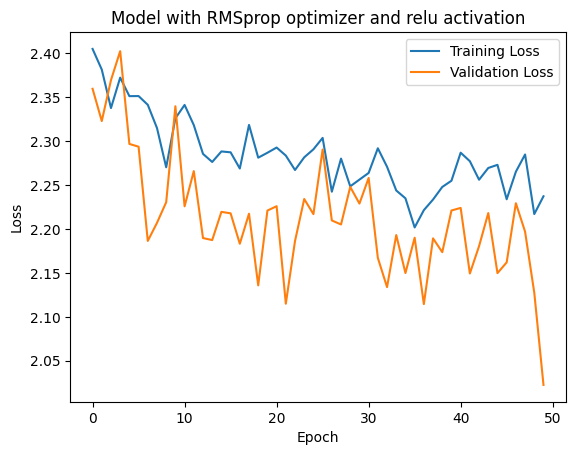

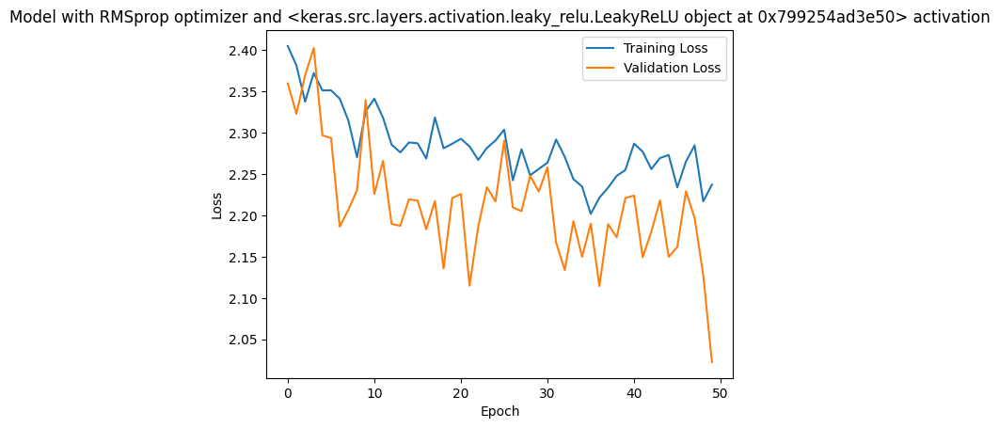

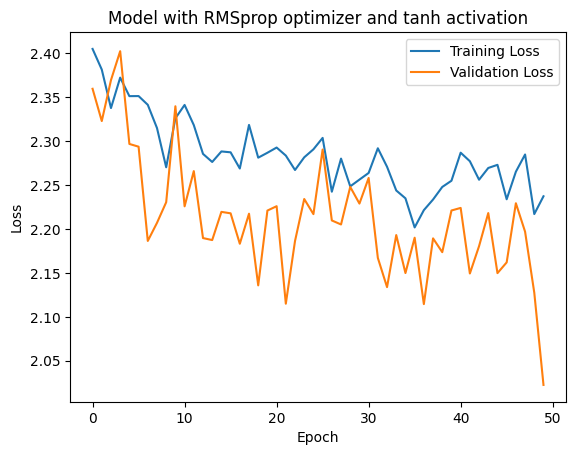

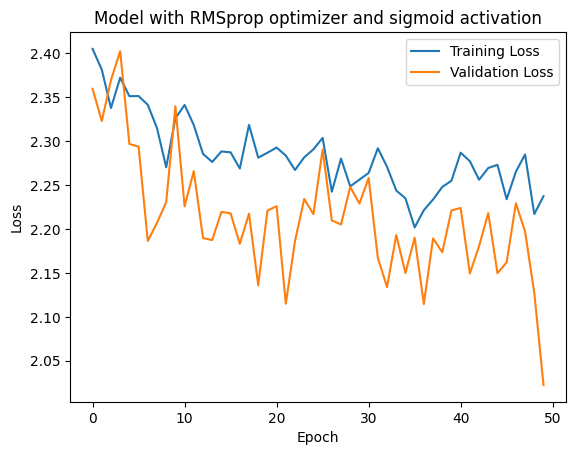

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()

with just **Adagrad optimizer** and other options

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adagrad
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    Adagrad(learning_rate=0.01, clipvalue=1.0)
]

# List of activations
activations = [
    'relu',  # ReLU activation
    tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Compile the model
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)

        # Evaluate the model on the test set
        loss = model.evaluate(X_test, y_test)
        print(f'Optimizer: {optimizer.get_config()["name"]}, Activation: {activation}, Mean Squared Error on Test Set: {loss}')

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


424/424 [==============================] - 1s 2ms/step - loss: 1.4657
Optimizer: Adagrad, Activation: relu, Mean Squared Error on Test Set: 1.4657150506973267
424/424 [==============================] - 1s 2ms/step - loss: 1.4553
Optimizer: Adagrad, Activation: <keras.src.layers.activation.leaky_relu.LeakyReLU object at 0x79923f5b6d40>, Mean Squared Error on Test Set: 1.4553314447402954
424/424 [==============================] - 1s 1ms/step - loss: 1.5315
Optimizer: Adagrad, Activation: tanh, Mean Squared Error on Test Set: 1.5314770936965942
424/424 [==============================] - 1s 2ms/step - loss: 1.4331
Optimizer: Adagrad, Activation: sigmoid, Mean Squared Error on Test Set: 1.4330824613571167


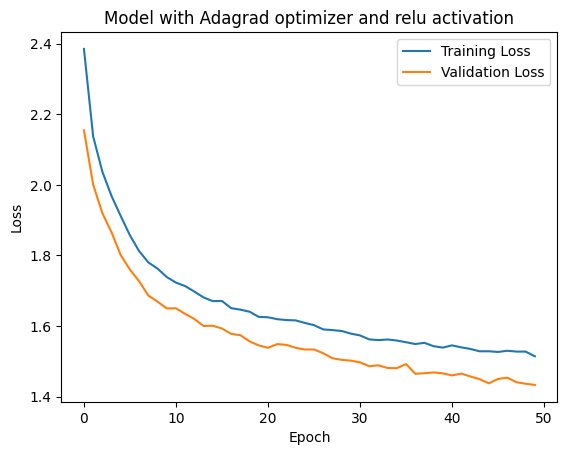

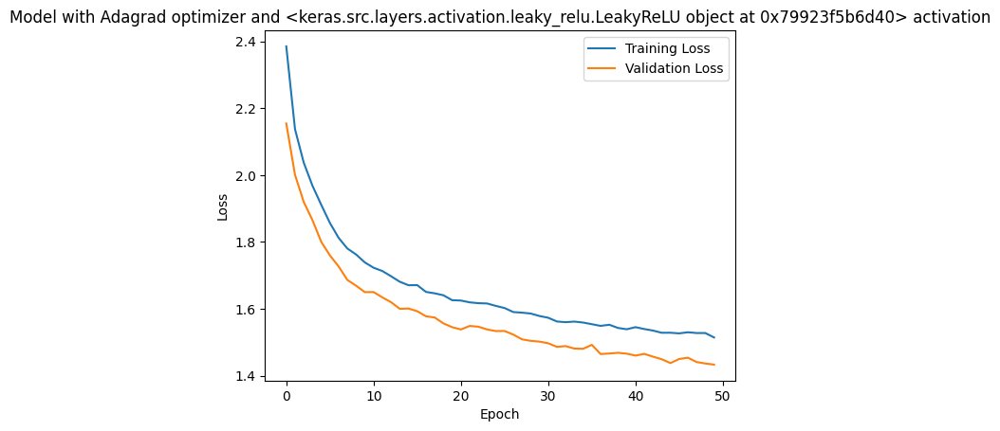

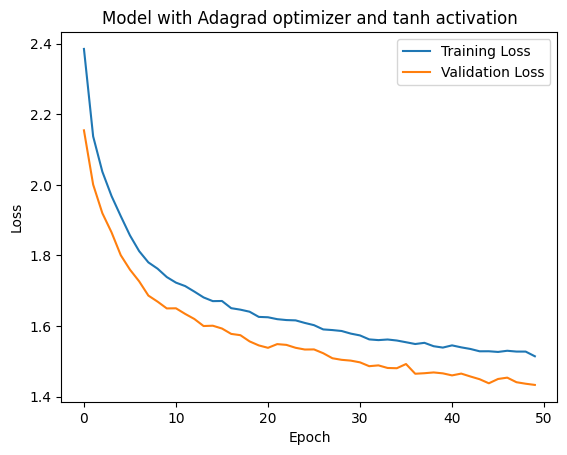

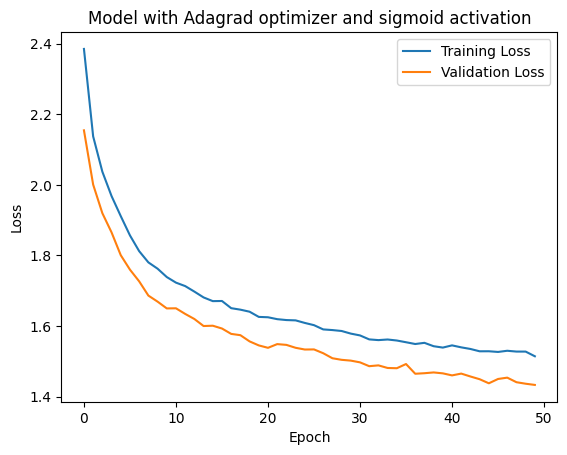

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()

with **Adadelta** and other options

In [ ]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adadelta
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# List of optimizers
optimizers = [
    Adadelta(learning_rate=0.01, clipvalue=1.0)
]

# List of activations
activations = [
    'relu',  # ReLU activation
    tf.keras.layers.LeakyReLU(alpha=0.01),  # Leaky ReLU activation
    'tanh',  # Tanh activation
    'sigmoid'  # Sigmoid activation
    # tf.keras.layers.PReLU(),  # Parametric ReLU activation
]

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Compile the model
        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=0)

        # Evaluate the model on the test set
        loss = model.evaluate(X_test, y_test)
        print(f'Optimizer: {optimizer.get_config()["name"]}, Activation: {activation}, Mean Squared Error on Test Set: {loss}')

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()


424/424 [==============================] - 1s 2ms/step - loss: 2.0034
Optimizer: Adadelta, Activation: relu, Mean Squared Error on Test Set: 2.0033962726593018
424/424 [==============================] - 1s 2ms/step - loss: 2.0542
Optimizer: Adadelta, Activation: <keras.src.layers.activation.leaky_relu.LeakyReLU object at 0x7992533ddc90>, Mean Squared Error on Test Set: 2.0542209148406982
424/424 [==============================] - 1s 2ms/step - loss: 1.8573
Optimizer: Adadelta, Activation: tanh, Mean Squared Error on Test Set: 1.857347846031189
424/424 [==============================] - 1s 2ms/step - loss: 1.9616
Optimizer: Adadelta, Activation: sigmoid, Mean Squared Error on Test Set: 1.9615579843521118


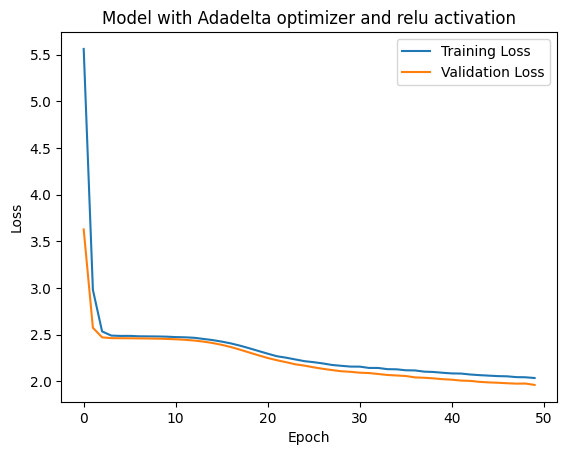

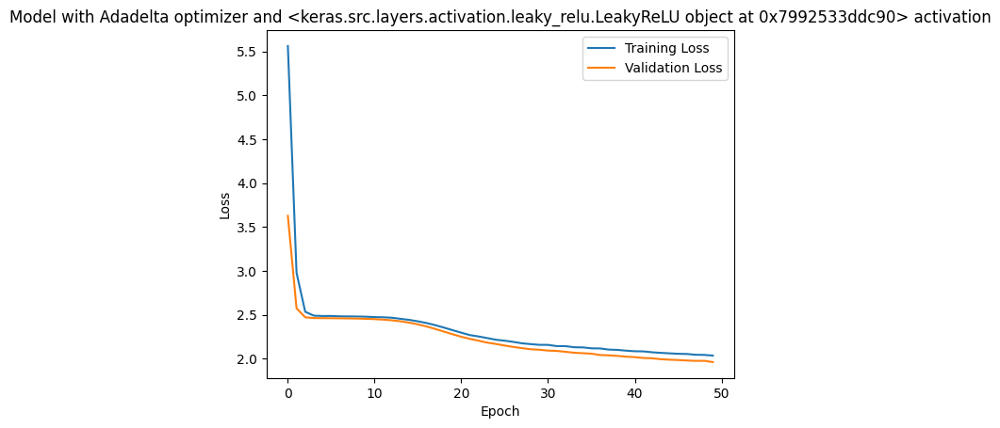

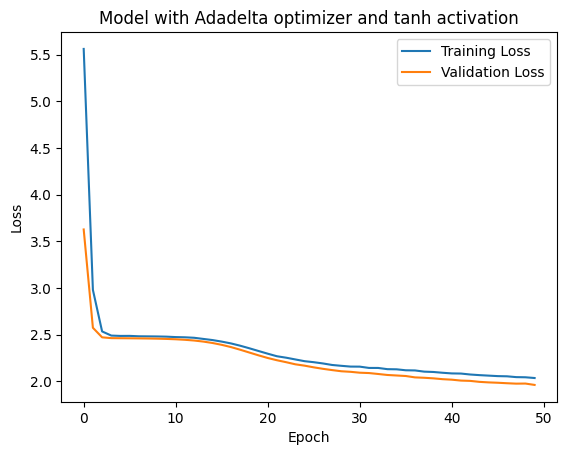

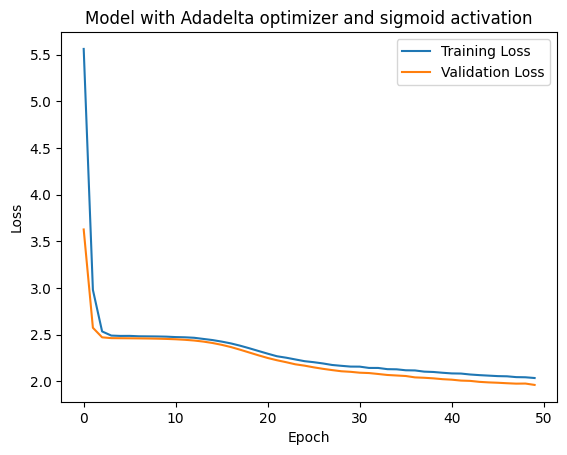

In [ ]:
import matplotlib.pyplot as plt


# Lists to store results
results = []
models = []

# Loop over optimizers and activations
for optimizer in optimizers:
    for activation in activations:
        # Build the model
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(128, activation=activation, input_shape=(X_train.shape[1],)),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(64),  # Removed activation here
            tf.keras.layers.Activation(activation),  # Apply activation separately
            tf.keras.layers.Dense(32),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(16),
            tf.keras.layers.Activation(activation),
            tf.keras.layers.Dense(1)
        ])

        # Store results
        results.append({
            'optimizer': optimizer.get_config()["name"],
            'activation': str(activation),
            'loss': history.history['loss'],
            'val_loss': history.history['val_loss']
        })
        models.append(model)

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title(f'Model with {optimizer.get_config()["name"]} optimizer and {activation} activation')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

        # Clear session to avoid potential issues
        tf.keras.backend.clear_session()

<Figure size 1000x800 with 0 Axes>

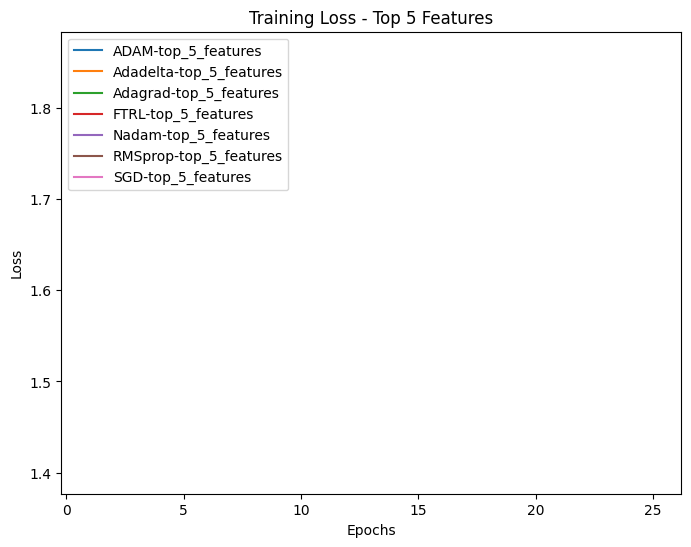

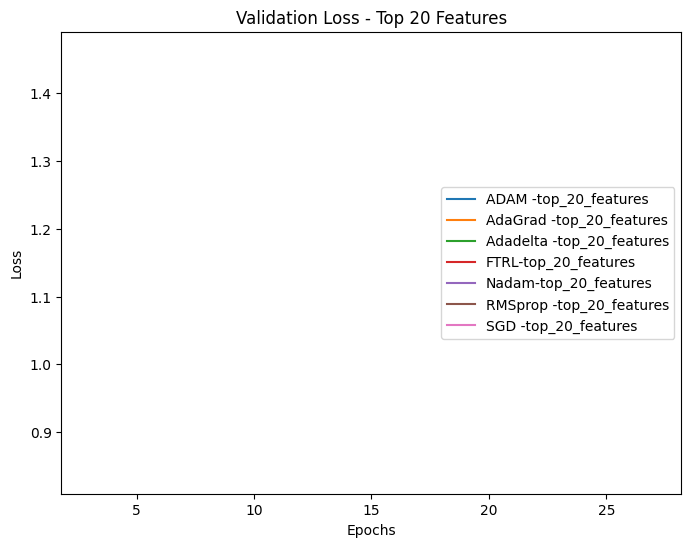

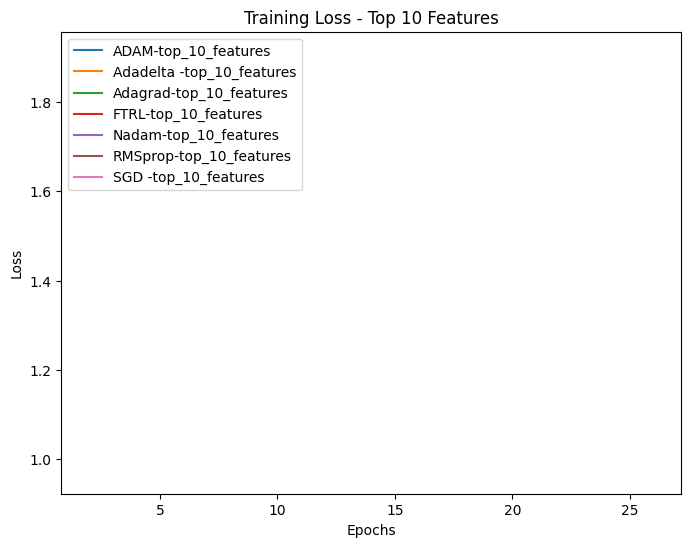

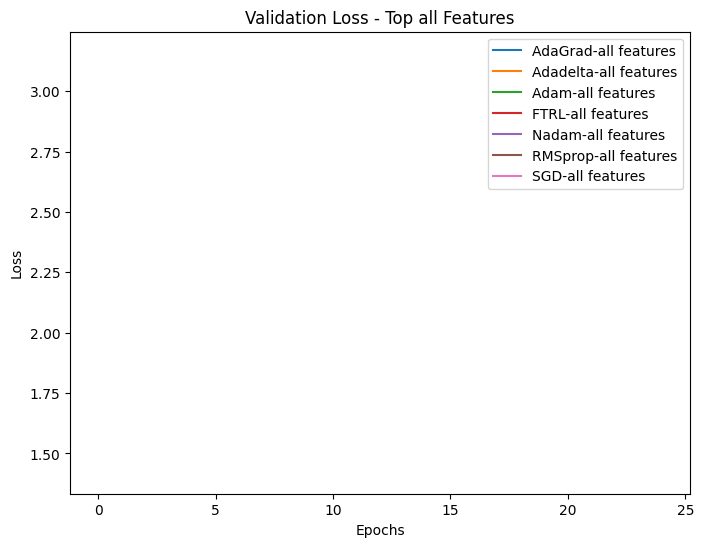

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data_title = "Optimizer	# layers	Epochs	Learning_rate	Batch_size	Loss	Val_loss."

# Define the data
data = """
Adam-all features	4	100	0.001	32	1.28	1.42
ADAM-top_5_features	4	100	0.001	32	1.42	1.48
ADAM-top_10_features	4	100	0.001	32	1.01	1.02
ADAM -top_20_features	4	100	0.001	32	0.83	0.88
SGD-all features	4	200	0.001	32	1.84	1.71
SGD-top_5_features	4	200	0.001	32	1.52	1.46
SGD -top_10_features	4	200	0.001	32	1.17	1.12
SGD -top_20_features	4	200	0.001	32	1.25	1.36
RMSprop-all features	4	150	0.001	32	1.47	1.66
RMSprop-top_5_features	4	150	0.001	32	1.48	1.16
RMSprop-top_10_features	4	150	0.001	32	1.07	1.04
RMSprop -top_20_features	4	150	0.001	32	1.04	1.08
AdaGrad-all features	4	150	0.001	32	2.06	2.07
Adagrad-top_5_features	4	150	0.001	32	1.76	1.63
Adagrad-top_10_features	4	150	0.001	32	1.51	1.42
AdaGrad -top_20_features	4	150	0.001	32	1.42	1.32
Adadelta-all features	4	200	0.001	32	3.83	3.16
Adadelta-top_5_features	4	200	0.001	32	1.86	1.72
Adadelta -top_10_features	4	200	0.001	32	1.67	1.53
Adadelta -top_20_features	4	200	0.001	32	1.60	1.46
FTRL-all features	4	200	0.001	32	2.18	2.19
FTRL-top_5_features	4	200	0.001	32	1.82	1.71
FTRL-top_10_features	4	200	0.001	32	1.91	1.71
FTRL-top_20_features	4	200	0.001	32	1.38	1.33
Nadam-all features	4	150	0.001	32	1.47	1.61
Nadam-top_5_features	4	150	0.001	32	1.40	1.39
Nadam-top_10_features	4	150	0.001	32	0.97	0.98
Nadam-top_20_features	4	150	0.001	32	0.79	0.84
"""

# Split the data into lines and extract columns
lines = data.strip().split('\n')
columns = [line.split('\t') for line in lines]

# Create a DataFrame
df = pd.DataFrame(columns, columns=["Model", "Layers", "Epochs", "Learning Rate", "Batch Size", "Training Loss", "Validation Loss"])

# Convert columns to appropriate data types
df[["Layers", "Epochs", "Batch Size"]] = df[["Layers", "Epochs", "Batch Size"]].astype(int)
df[["Learning Rate", "Training Loss", "Validation Loss"]] = df[["Learning Rate", "Training Loss", "Validation Loss"]].astype(float)

# Filter data for different features
top_5_features = df[df["Model"].str.contains("top_5_features")]
top_10_features = df[df["Model"].str.contains("top_10_features")]
top_20_features = df[df["Model"].str.contains("top_20_features")]
all_features = df[~df["Model"].str.contains("top")]

# Plotting
plt.figure(figsize=(10, 8))

# Plot for top_5_features training loss
plt.figure(figsize=(8, 6))
for model, group in top_5_features.groupby("Model"):
    plt.plot(group["Training Loss"], label=model)
plt.title("Training Loss - Top 5 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot for top_5_features validation loss
plt.figure(figsize=(8, 6))
for model, group in top_20_features.groupby("Model"):
    plt.plot(group["Validation Loss"], label=model)
plt.title("Validation Loss - Top 20 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot for top_10_features training loss
plt.figure(figsize=(8, 6))
for model, group in top_10_features.groupby("Model"):
    plt.plot(group["Training Loss"], label=model)
plt.title("Training Loss - Top 10 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot for top_10_features validation loss
plt.figure(figsize=(8, 6))
for model, group in all_features.groupby("Model"):
    plt.plot(group["Validation Loss"], label=model)
plt.title("Validation Loss - Top all Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()


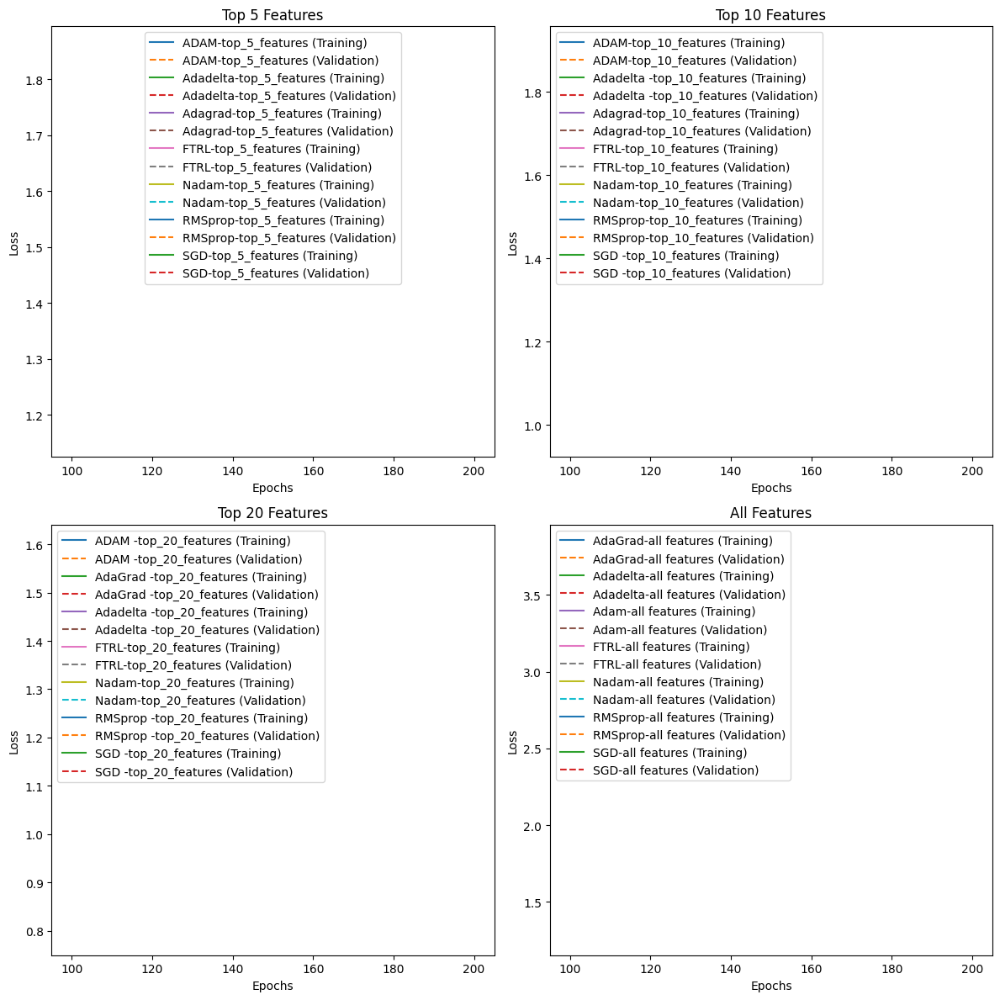

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data_title = "Optimizer	# layers	Epochs	Learning_rate	Batch_size	Loss	Val_loss."

# Define the data
data = """
Adam-all features	4	100	0.001	32	1.28	1.42
ADAM-top_5_features	4	100	0.001	32	1.42	1.48
ADAM-top_10_features	4	100	0.001	32	1.01	1.02
ADAM -top_20_features	4	100	0.001	32	0.83	0.88
SGD-all features	4	200	0.001	32	1.84	1.71
SGD-top_5_features	4	200	0.001	32	1.52	1.46
SGD -top_10_features	4	200	0.001	32	1.17	1.12
SGD -top_20_features	4	200	0.001	32	1.25	1.36
RMSprop-all features	4	150	0.001	32	1.47	1.66
RMSprop-top_5_features	4	150	0.001	32	1.48	1.16
RMSprop-top_10_features	4	150	0.001	32	1.07	1.04
RMSprop -top_20_features	4	150	0.001	32	1.04	1.08
AdaGrad-all features	4	150	0.001	32	2.06	2.07
Adagrad-top_5_features	4	150	0.001	32	1.76	1.63
Adagrad-top_10_features	4	150	0.001	32	1.51	1.42
AdaGrad -top_20_features	4	150	0.001	32	1.42	1.32
Adadelta-all features	4	200	0.001	32	3.83	3.16
Adadelta-top_5_features	4	200	0.001	32	1.86	1.72
Adadelta -top_10_features	4	200	0.001	32	1.67	1.53
Adadelta -top_20_features	4	200	0.001	32	1.60	1.46
FTRL-all features	4	200	0.001	32	2.18	2.19
FTRL-top_5_features	4	200	0.001	32	1.82	1.71
FTRL-top_10_features	4	200	0.001	32	1.91	1.71
FTRL-top_20_features	4	200	0.001	32	1.38	1.33
Nadam-all features	4	150	0.001	32	1.47	1.61
Nadam-top_5_features	4	150	0.001	32	1.40	1.39
Nadam-top_10_features	4	150	0.001	32	0.97	0.98
Nadam-top_20_features	4	150	0.001	32	0.79	0.84
"""

# Split the data into lines and extract columns
lines = data.strip().split('\n')
columns = [line.split('\t') for line in lines]

# Create a DataFrame
df = pd.DataFrame(columns, columns=["Model", "Layers", "Epochs", "Learning Rate", "Batch Size", "Training Loss", "Validation Loss"])

# Convert columns to appropriate data types
df[["Layers", "Epochs", "Batch Size"]] = df[["Layers", "Epochs", "Batch Size"]].astype(int)
df[["Learning Rate", "Training Loss", "Validation Loss"]] = df[["Learning Rate", "Training Loss", "Validation Loss"]].astype(float)

# Filter data for different features
top_5_features = df[df["Model"].str.contains("top_5_features")]
top_10_features = df[df["Model"].str.contains("top_10_features")]
top_20_features = df[df["Model"].str.contains("top_20_features")]
all_features = df[~df["Model"].str.contains("top")]

# Plotting
plt.figure(figsize=(12, 12))

# Plot for top_5_features training and validation loss
plt.subplot(2, 2, 1)
for model, group in top_5_features.groupby("Model"):
    plt.plot(group["Epochs"], group["Training Loss"], label=model + " (Training)")
    plt.plot(group["Epochs"], group["Validation Loss"], linestyle='--', label=model + " (Validation)")
plt.title("Top 5 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Plot for top_10_features training and validation loss
plt.subplot(2, 2, 2)
for model, group in top_10_features.groupby("Model"):
    plt.plot(group["Epochs"], group["Training Loss"], label=model + " (Training)")
    plt.plot(group["Epochs"], group["Validation Loss"], linestyle='--', label=model + " (Validation)")
plt.title("Top 10 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Plot for top_20_features training and validation loss
plt.subplot(2, 2, 3)
for model, group in top_20_features.groupby("Model"):
    plt.plot(group["Epochs"], group["Training Loss"], label=model + " (Training)")
    plt.plot(group["Epochs"], group["Validation Loss"], linestyle='--', label=model + " (Validation)")
plt.title("Top 20 Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Plot for all_features training and validation loss
plt.subplot(2, 2, 4)
for model, group in all_features.groupby("Model"):
    plt.plot(group["Epochs"], group["Training Loss"], label=model + " (Training)")
    plt.plot(group["Epochs"], group["Validation Loss"], linestyle='--', label=model + " (Validation)")
plt.title("All Features")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()


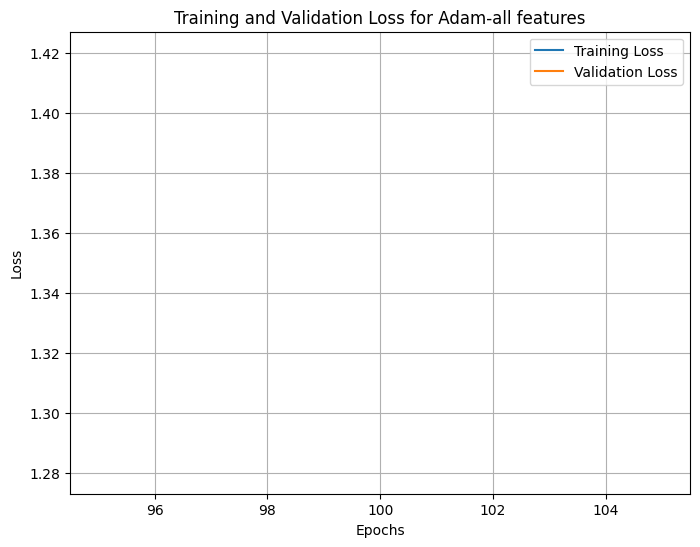

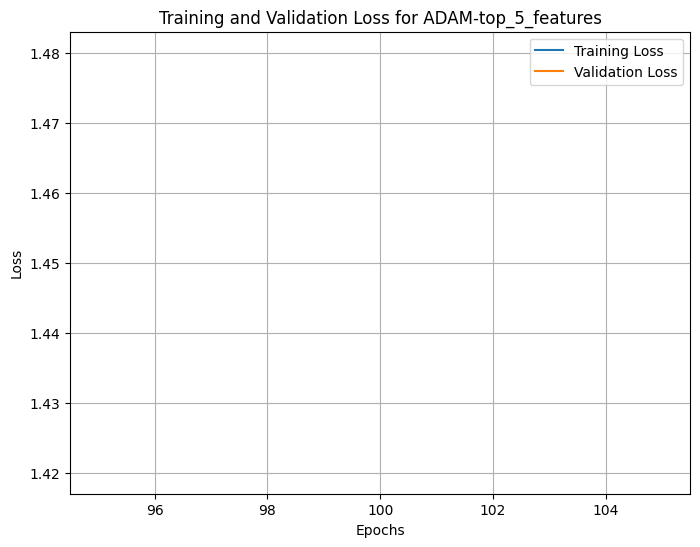

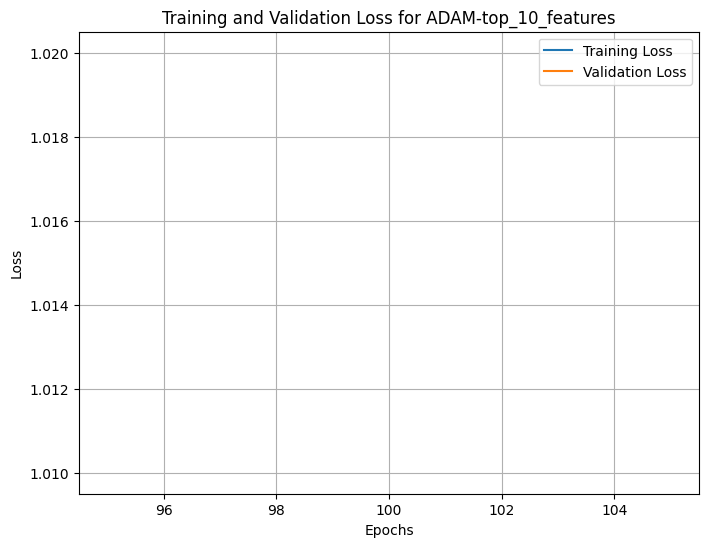

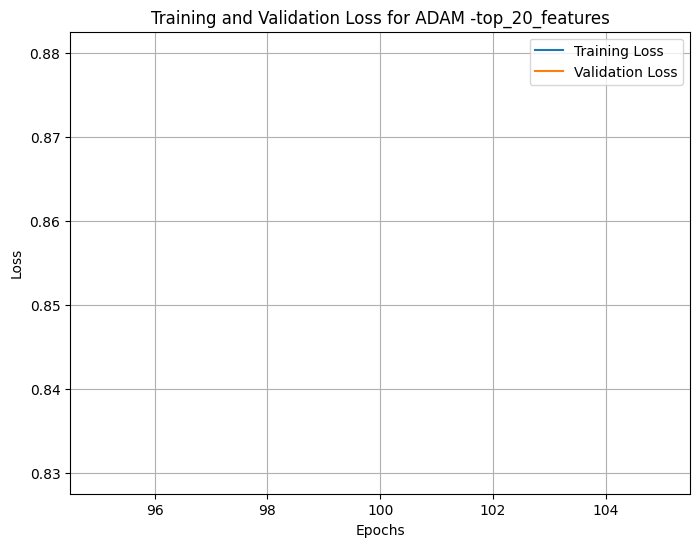

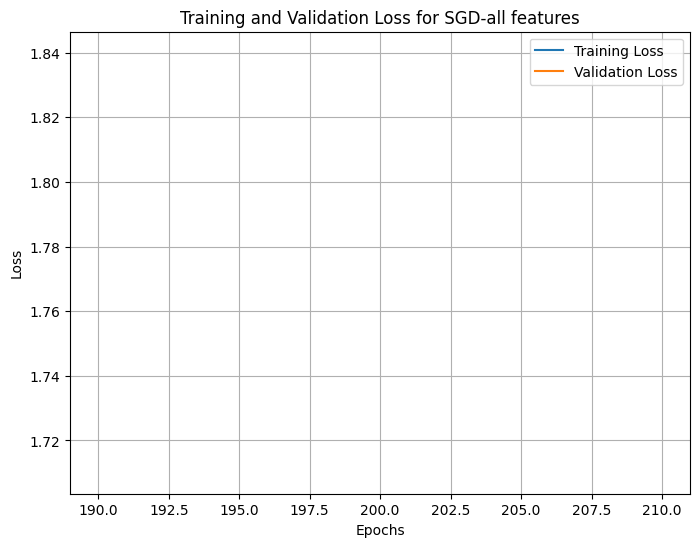

...

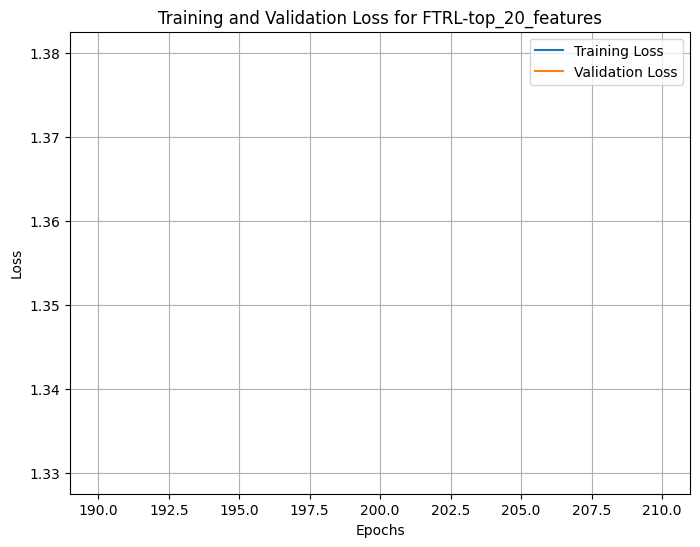

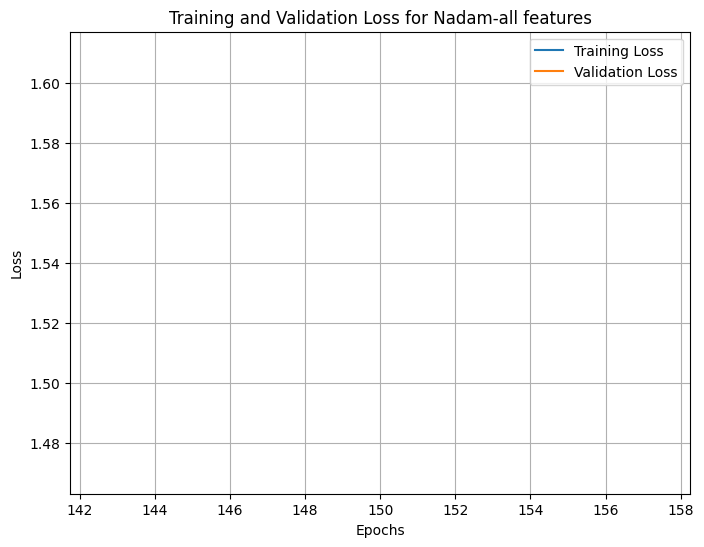

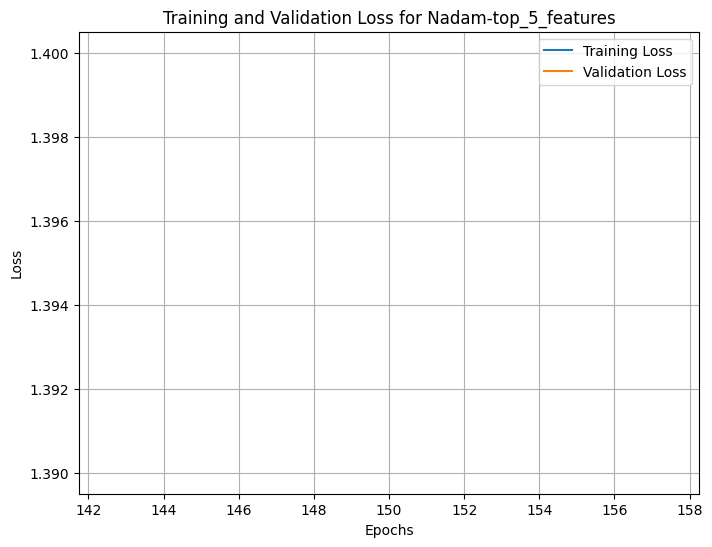

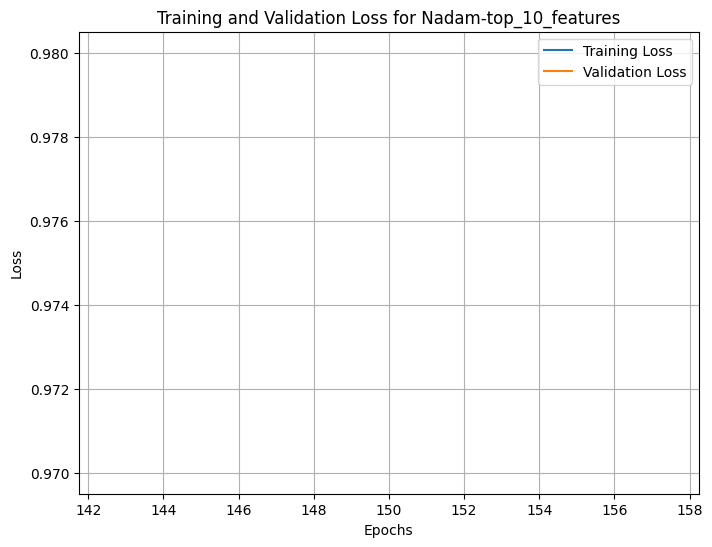

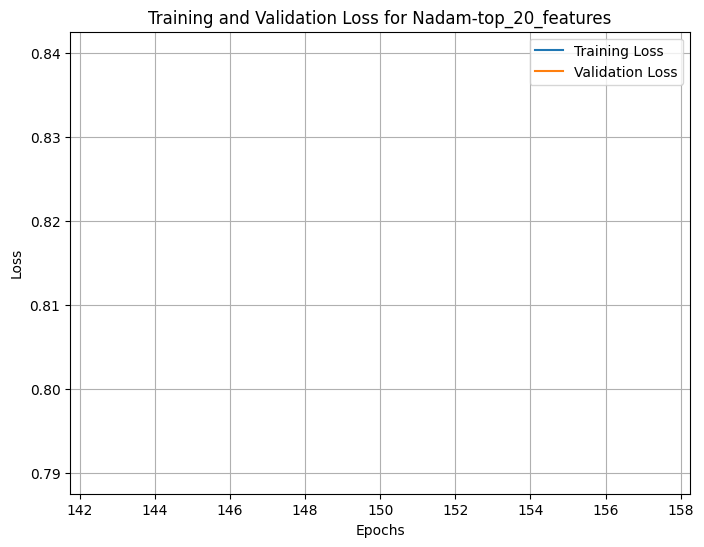

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data_title = "Optimizer	# layers	Epochs	Learning_rate	Batch_size	Loss	Val_loss."

# Define the data
data = """
Adam-all features	4	100	0.001	32	1.28	1.42
ADAM-top_5_features	4	100	0.001	32	1.42	1.48
ADAM-top_10_features	4	100	0.001	32	1.01	1.02
ADAM -top_20_features	4	100	0.001	32	0.83	0.88
SGD-all features	4	200	0.001	32	1.84	1.71
SGD-top_5_features	4	200	0.001	32	1.52	1.46
SGD -top_10_features	4	200	0.001	32	1.17	1.12
SGD -top_20_features	4	200	0.001	32	1.25	1.36
RMSprop-all features	4	150	0.001	32	1.47	1.66
RMSprop-top_5_features	4	150	0.001	32	1.48	1.16
RMSprop-top_10_features	4	150	0.001	32	1.07	1.04
RMSprop -top_20_features	4	150	0.001	32	1.04	1.08
AdaGrad-all features	4	150	0.001	32	2.06	2.07
Adagrad-top_5_features	4	150	0.001	32	1.76	1.63
Adagrad-top_10_features	4	150	0.001	32	1.51	1.42
AdaGrad -top_20_features	4	150	0.001	32	1.42	1.32
Adadelta-all features	4	200	0.001	32	3.83	3.16
Adadelta-top_5_features	4	200	0.001	32	1.86	1.72
Adadelta -top_10_features	4	200	0.001	32	1.67	1.53
Adadelta -top_20_features	4	200	0.001	32	1.60	1.46
FTRL-all features	4	200	0.001	32	2.18	2.19
FTRL-top_5_features	4	200	0.001	32	1.82	1.71
FTRL-top_10_features	4	200	0.001	32	1.91	1.71
FTRL-top_20_features	4	200	0.001	32	1.38	1.33
Nadam-all features	4	150	0.001	32	1.47	1.61
Nadam-top_5_features	4	150	0.001	32	1.40	1.39
Nadam-top_10_features	4	150	0.001	32	0.97	0.98
Nadam-top_20_features	4	150	0.001	32	0.79	0.84
"""

# Split the data into lines and extract columns
lines = data.strip().split('\n')
columns = [line.split('\t') for line in lines]

# Create a DataFrame
df = pd.DataFrame(columns, columns=["Model", "Layers", "Epochs", "Learning Rate", "Batch Size", "Training Loss", "Validation Loss"])

# Convert columns to appropriate data types
df[["Layers", "Epochs", "Batch Size"]] = df[["Layers", "Epochs", "Batch Size"]].astype(int)
df[["Learning Rate", "Training Loss", "Validation Loss"]] = df[["Learning Rate", "Training Loss", "Validation Loss"]].astype(float)

# Separate data for each model
models = df['Model'].unique()

# Plotting
for model_name in models:
    model_data = df[df['Model'] == model_name]

    plt.figure(figsize=(8, 6))
    plt.plot(model_data['Epochs'], model_data['Training Loss'], label='Training Loss')
    plt.plot(model_data['Epochs'], model_data['Validation Loss'], label='Validation Loss')
    plt.title(f"Training and Validation Loss for {model_name}")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
